In [ ]:
import os
from typing import Optional, Tuple, List, Union, Callable

import numpy as np
import torch
from torch import nn
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
from tqdm import trange

In [ ]:
if not os.path.exists('tiny_nerf_data.npz'):
  !wget http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz

In [ ]:
data = np.load('tiny_nerf_data.npz')
images = data['images']
poses = data['poses']
focal = data['focal']

print(images.shape)
print(poses.shape)
print(focal)

(106, 100, 100, 3)
(106, 4, 4)
138.88887889922103


[-1.9745398 -1.8789345  2.9699826]
[[ 6.8935126e-01  5.3373039e-01 -4.8982298e-01 -1.9745398e+00]
 [-7.2442728e-01  5.0788772e-01 -4.6610624e-01 -1.8789345e+00]
 [ 1.4901163e-08  6.7615211e-01  7.3676193e-01  2.9699826e+00]
 [ 0.0000000e+00  0.0000000e+00  0.0000000e+00  1.0000000e+00]]


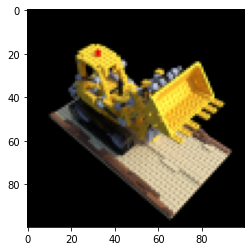

In [ ]:
height = images.shape[1]
width = images.shape[2]
training_size = 100
test_image = images[training_size+1]
test_pose = poses[training_size+1]

plt.imshow(test_image)
print(poses[training_size+1,:3,3])
print(test_pose)

In [ ]:
device = torch.device('cpu')
images = torch.from_numpy(data['images'][:training_size+1]).to(device)
poses = torch.from_numpy(data['poses']).to(device)
focal_length = torch.from_numpy(data['focal']).to(device)
test_pose = torch.from_numpy(data['poses'][training_size+1]).to(device)
test_image = torch.from_numpy(data['images'][training_size+1]).to(device)

In [ ]:
def get_ray(height:int, width: int, focal_length: float, c2w: torch.Tensor):
  i,j = torch.meshgrid(
      torch.arange(width).to(test_pose),
      torch.arange(height).to(test_pose),
  )
  i = i.transpose(0, 1)
  j = j.transpose(0, 1)
  #why center?
  directions = torch.stack([(i - width * .5) / focal_length, -(j - height * .5) / focal_length, -torch.ones_like(i)], dim=-1)
  #what are these formulas? What is the magical 3x3 c2w matrix
  rays_d = torch.sum(directions[..., None, :] * c2w[:3, :3], dim=-1)
  #why is the last column of c2w contain the origin?
  rays_o = c2w[:3, -1].expand(rays_d.shape)
  return rays_o, rays_d

In [ ]:
ray_origin, ray_direction = get_ray(height, width, focal, test_pose)
print(ray_origin.shape)
#print(ray_direction[:,:2,:])

torch.Size([100, 100, 3])


In [ ]:
rays_min, rays_max = 2., 6.
def sample_stratified(rays_origin: torch.Tensor, rays_dir: torch.Tensor, rays_min: float, rays_max: float, n_samples: int, perturb: Optional[bool] = True, inverse_depth: bool = False):
  # uniform bins
  t_vals = torch.linspace(0., 1., n_samples, device=rays_origin.device)
  if not inverse_depth:
    # scaled by ray size
    z_vals = rays_min * (1.-t_vals) + rays_max * (t_vals)
  else:
    # why
    z_vals = 1./(1./rays_min * (1.-t_vals) + 1./rays_max * (t_vals))

  # Draw uniform samples from within bins along ray
  if perturb:
    # calc mid for all bins
    mids = .5 * (z_vals[1:] + z_vals[:-1])
    upper = torch.concat([mids, z_vals[-1:]], dim=-1)
    lower = torch.concat([z_vals[:1], mids], dim=-1)
    t_rand = torch.rand([n_samples], device=z_vals.device)
    # calc varience off center
    z_vals = lower + (upper - lower) * t_rand
  #print(z_vals.shape)    
  # expand to fit the next calc
  z_vals = z_vals.expand(list(rays_origin.shape[:-1]) + [n_samples])
  #print(z_vals.shape)
  # Apply scale from `dist` and offset from `origin` to samples
  # pts: (width, height, n_samples, 3)
  pts = rays_origin[..., None, :] + rays_dir[..., None, :] * z_vals[..., :, None]  
  return pts, z_vals

In [ ]:
# group all into 1d tensor
ray_origin = ray_origin.view([-1, 3])
ray_direction = ray_direction.view([-1, 3])
# pts are sample points from each ray as 3d points in space
# z_val are distances of each sample from the origin in 3d space
pts, z_val = sample_stratified(ray_origin, ray_direction, rays_min, rays_max, 8)
print(ray_origin.shape)

torch.Size([10000, 3])


In [ ]:
pts = pts.reshape((-1,3))

In [ ]:
class NeRF(nn.Module):
  def __init__(
    self,
    d_input: int = 3,
    n_layers: int = 8,
    per_layer: int = 128,
    skip: Tuple[int] = (4,),
    d_viewdirs: Optional[int] = None
  ):
    super().__init__()
    self.d_input = d_input
    self.skip = skip
    self.act = nn.functional.relu
    self.d_viewdirs = d_viewdirs

    # define model layers, layers is later looped through like an array an each layer used like a function
    self.layers = nn.ModuleList(
      [nn.Linear(self.d_input, per_layer)] +
      [nn.Linear(per_layer + self.d_input, per_layer) if i in skip \
       else nn.Linear(per_layer, per_layer) for i in range(n_layers - 1)]
    )

    # defining final 3 layers as per the model
    if self.d_viewdirs is not None:
      # the alpha gets split by creating its own output layer
      self.alpha_out = nn.Linear(per_layer, 1)
      # 3rd to last layer
      self.rgb_filters = nn.Linear(per_layer, per_layer)
      # half size layer that includes last layer and viewing direction
      #print(self.d_viewdirs)
      self.branch = nn.Linear(per_layer, per_layer // 2)
      # RGB output layer
      self.output = nn.Linear(per_layer // 2, 3)
    else:
      # If no viewdirs, use simpler output
      self.output = nn.Linear(per_layer, 4)
  
  def forward(
    self,
    x: torch.Tensor,
    viewdirs: Optional[torch.Tensor] = None
  ):

    # Cannot use viewdirs if instantiated with d_viewdirs = None
    if self.d_viewdirs is None and viewdirs is not None:
      raise ValueError('Cannot input x_direction if d_viewdirs was not given.')

    # save the input for second insertion
    x_input = x
    # loop through the standard layers
    for i, layer in enumerate(self.layers):
      # run through activation function
      x = self.act(layer(x))
      if i in self.skip:
        # include second insert
        x = torch.cat([x, x_input], dim=-1)

    # Apply bottleneck
    if self.d_viewdirs is not None:
      # get alpha from network output
      alpha = self.alpha_out(x)

      # Pass through second part to get RGB
      x = self.rgb_filters(x)
      x = torch.concat([x, viewdirs], dim=-1)
      x = self.act(self.branch(x))
      x = self.output(x)

      # Concatenate alphas to output
      x = torch.concat([x, alpha], dim=-1)
    else:
      # Simple output
      x = self.output(x)
    return x

In [ ]:
def cumprod_exclusive(
  tensor: torch.Tensor
) -> torch.Tensor:
  r"""
  (Courtesy of https://github.com/krrish94/nerf-pytorch)

  Mimick functionality of tf.math.cumprod(..., exclusive=True), as it isn't available in PyTorch.

  Args:
  tensor (torch.Tensor): Tensor whose cumprod (cumulative product, see `torch.cumprod`) along dim=-1
    is to be computed.
  Returns:
  cumprod (torch.Tensor): cumprod of Tensor along dim=-1, mimiciking the functionality of
    tf.math.cumprod(..., exclusive=True) (see `tf.math.cumprod` for details).
  """

  # Compute regular cumprod first (this is equivalent to `tf.math.cumprod(..., exclusive=False)`).
  cumprod = torch.cumprod(tensor, -1)
  # "Roll" the elements along dimension 'dim' by 1 element.
  cumprod = torch.roll(cumprod, 1, -1)
  # Replace the first element by "1" as this is what tf.cumprod(..., exclusive=True) does.
  cumprod[..., 0] = 1.
  
  return cumprod

In [ ]:
def VolumeRenderer(
  raw: torch.Tensor,
  z_vals: torch.Tensor,
  rays_dir: torch.Tensor,
  raw_noise_std: float = 0.0,
  white_bkgd: bool = False
):

  # Distance between consecutive samples of given ray [n_rays, n_samples]
  dists = z_vals[..., 1:] - z_vals[..., :-1]
  dists = torch.cat([dists, 1e10 * torch.ones_like(dists[..., :1])], dim=-1)

  # Multiply each distance by the norm of its corresponding direction ray
  # to convert to real world distance (accounts for non-unit directions).
  dists = dists * torch.norm(rays_dir[..., None, :], dim=-1)

  # Add noise to model's predictions for density. Can be used to 
  # regularize network during training (prevents floater artifacts).
  noise = 0. 
  if raw_noise_std > 0.:
    noise = torch.randn(raw[..., 3].shape) * raw_noise_std

  # Predict density of each sample along each ray. Higher values imply
  # higher likelihood of being absorbed at this point. [n_rays, n_samples]
  alpha = 1.0 - torch.exp(-nn.functional.relu(raw[..., 3] + noise) * dists)

  # Compute weight for RGB of each sample along each ray. [n_rays, n_samples]
  # The higher the alpha, the lower subsequent weights are driven.
  weights = alpha * cumprod_exclusive(1. - alpha + 1e-10)

  # Compute weighted RGB map.
  rgb = torch.sigmoid(raw[..., :3])  # [n_rays, n_samples, 3]
  rgb_map = torch.sum(weights[..., None] * rgb, dim=-2)  # [n_rays, 3]

  # Estimated depth map is predicted distance.
  depth_map = torch.sum(weights * z_vals, dim=-1)

  # ???Disparity map is inverse depth.
  disp_map = 1. / torch.max(1e-10 * torch.ones_like(depth_map),
                            depth_map / torch.sum(weights, -1))

  # Sum of weights along each ray. In [0, 1] up to numerical error.
  acc_map = torch.sum(weights, dim=-1)

  # To composite onto a white background, use the accumulated alpha map.
  if white_bkgd:
    rgb_map = rgb_map + (1. - acc_map[..., None])

  return rgb_map, depth_map, acc_map, weights

In [ ]:
def get_chunks(
  inputs: torch.Tensor,
  chunksize: int = 2**15
):
  # ???
  return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

In [ ]:
def prepare_chunks(
  points: torch.Tensor,
  #encoding_function: Callable[[torch.Tensor], torch.Tensor],
  chunksize: int = 2**15
):
  points = points.reshape((-1, 3))
  # no encoder yet
  #points = encoding_function(points)
  points = get_chunks(points, chunksize=chunksize)
  return points

In [ ]:
def prepare_viewdirs_chunks(
  points: torch.Tensor,
  rays_dir: torch.Tensor,
  #encoding_function: Callable[[torch.Tensor], torch.Tensor],
  chunksize: int = 2**15
) -> List[torch.Tensor]:
  r"""
  Encode and chunkify viewdirs to prepare for NeRF model.
  """
  # Prepare the viewdirs
  viewdirs = rays_dir #/ torch.norm(rays_dir, dim=-1, keepdim=True)
  viewdirs = viewdirs[:, None, ...].expand(points.shape).reshape((-1, 3))
  #viewdirs = encoding_function(viewdirs)
  viewdirs = get_chunks(viewdirs, chunksize=chunksize)
  return viewdirs

In [ ]:
def nerf_forward(
  rays_ori: torch.Tensor,
  rays_dir: torch.Tensor,
  ray_min: float,
  ray_max: float,
  #encoding_fn: Callable[[torch.Tensor], torch.Tensor],
  coarse_model: nn.Module,
  kwargs_sample_stratified: dict = None,
  #n_samples_hierarchical: int = 0,
  #kwargs_sample_hierarchical: dict = None,
  #viewdirs_encoding_fn: Optional[Callable[[torch.Tensor], torch.Tensor]] = None,
  chunksize: int = 2**15
):

  # Set no kwargs if none are given.
  if kwargs_sample_stratified is None:
    kwargs_sample_stratified = {}
  #if kwargs_sample_hierarchical is None:
    #kwargs_sample_hierarchical = {}
  
  # Sample query points along each ray.
  query_points, z_vals = sample_stratified(rays_ori, rays_dir, ray_min, ray_max, **kwargs_sample_stratified)

  # Prepare batches.
  batches = prepare_chunks(query_points, chunksize=chunksize)
  #if viewdirs_encoding_fn is not None:
   # batches_viewdirs = prepare_viewdirs_chunks(query_points, rays_d, viewdirs_encoding_fn, chunksize=chunksize)
  #else:
  batches_viewdirs = [None] * len(batches)

  # Coarse model pass.
  # Split the encoded points into "chunks", run the model on all chunks, and
  # concatenate the results (to avoid out-of-memory issues).
  predictions = []
  for batch, batch_viewdirs in zip(batches, batches_viewdirs):
    F = coarse_model(batch, viewdirs=batch_viewdirs)
    predictions.append(F)
  raw = torch.cat(predictions, dim=0)
  raw = raw.reshape(list(query_points.shape[:2]) + [raw.shape[-1]])

  # Perform differentiable volume rendering to re-synthesize the RGB image.
  rgb_map, depth_map, acc_map, weights = VolumeRenderer(raw, z_vals, rays_dir)
  # rgb_map, depth_map, acc_map, weights = render_volume_density(raw, rays_o, z_vals)
  # Fine model pass.
  """
  if n_samples_hierarchical > 0:
    # Save previous outputs to return.
    rgb_map_0, depth_map_0, acc_map_0 = rgb_map, depth_map, acc_map

    # Apply hierarchical sampling for fine query points.
    query_points, z_vals_combined, z_hierarch = sample_hierarchical(
      rays_o, rays_d, z_vals, weights, n_samples_hierarchical,
      **kwargs_sample_hierarchical)

    # Prepare inputs as before.
    batches = prepare_chunks(query_points, encoding_fn, chunksize=chunksize)
    if viewdirs_encoding_fn is not None:
      batches_viewdirs = prepare_viewdirs_chunks(query_points, rays_d,
                                                 viewdirs_encoding_fn,
                                                 chunksize=chunksize)
    else:
      batches_viewdirs = [None] * len(batches)

    # Forward pass new samples through fine model.
    fine_model = fine_model if fine_model is not None else coarse_model
    predictions = []
    for batch, batch_viewdirs in zip(batches, batches_viewdirs):
      predictions.append(fine_model(batch, viewdirs=batch_viewdirs))
    raw = torch.cat(predictions, dim=0)
    raw = raw.reshape(list(query_points.shape[:2]) + [raw.shape[-1]])

    # Perform differentiable volume rendering to re-synthesize the RGB image.
    rgb_map, depth_map, acc_map, weights = raw2outputs(raw, z_vals_combined, rays_d)
    
    # Store outputs.
    outputs['z_vals_hierarchical'] = z_hierarch
    outputs['rgb_map_0'] = rgb_map_0
    outputs['depth_map_0'] = depth_map_0
    outputs['acc_map_0'] = acc_map_0
  """
  # Store outputs.
  outputs = {
      'rgb_map' : rgb_map
  }
  outputs['depth_map'] = depth_map
  outputs['acc_map'] = acc_map
  outputs['weights'] = weights
  return outputs

In [ ]:
# Encoders
d_input = 3           # Number of input dimensions
n_freqs = 10          # Number of encoding functions for samples
log_space = True      # If set, frequencies scale in log space
use_viewdirs = True   # If set, use view direction as input
n_freqs_views = 4     # Number of encoding functions for views

# Stratified sampling
n_samples = 64         # Number of spatial samples per ray
perturb = True         # If set, applies noise to sample positions
inverse_depth = False  # If set, samples points linearly in inverse depth

# Model
per_layer = 128        # Dimensions of linear layer filters
n_layers = 2            # Number of layers in network bottleneck
skip = []               # Layers at which to apply input residual
use_fine_model = False   # If set, creates a fine model
d_filter_fine = 128     # Dimensions of linear layer filters of fine network
n_layers_fine = 6       # Number of layers in fine network bottleneck

# Hierarchical sampling
n_samples_hierarchical = 64   # Number of samples per ray
perturb_hierarchical = False  # If set, applies noise to sample positions

# Optimizer
lr = 5e-4  # Learning rate

# Training
n_iters = 10000
batch_size = 2**10          # Number of rays per gradient step (power of 2)
one_image_per_step = True   # One image per gradient step (disables batching)
chunksize = 2**10          # Modify as needed to fit in GPU memory
center_crop = True         # Crop the center of image (one_image_per_)
center_crop_iters = 50      # Stop cropping center after this many epochs
display_rate = 25          # Display test output every X epochs

# Early Stopping
warmup_iters = 100          # Number of iterations during warmup phase
warmup_min_fitness = 10.0   # Min val PSNR to continue training at warmup_iters
n_restarts = 10             # Number of times to restart if training stalls

# We bundle the kwargs for various functions to pass all at once.
kwargs_sample_stratified = {
    'n_samples': n_samples,
    'perturb': perturb,
    'inverse_depth': inverse_depth
}
kwargs_sample_hierarchical = {
    'perturb': perturb
}

In [ ]:
def plot_samples(
  z_vals: torch.Tensor,
  z_hierarch: Optional[torch.Tensor] = None,
  ax: Optional[np.ndarray] = None):
  y_vals = 1 + np.zeros_like(z_vals)

  if ax is None:
    ax = plt.subplot()
  ax.plot(z_vals, y_vals, 'b-o')
  if z_hierarch is not None:
    y_hierarch = np.zeros_like(z_hierarch)
    ax.plot(z_hierarch, y_hierarch, 'r-o')
  ax.set_ylim([-1, 2])
  ax.set_title('Stratified  Samples (blue) and Hierarchical Samples (red)')
  ax.axes.yaxis.set_visible(False)
  ax.grid(True)
  return ax

def crop_center(
  img: torch.Tensor,
  frac: float = 0.5
) -> torch.Tensor:
  r"""
  Crop center square from image.
  """
  h_offset = round(img.shape[0] * (frac / 2))
  w_offset = round(img.shape[1] * (frac / 2))
  return img[h_offset:-h_offset, w_offset:-w_offset]


In [ ]:
class EarlyStopping:
  def __init__(
    self,
    patience: int = 30,
    margin: float = 1e-4
  ):
    self.best_fitness = 0.0  # In our case PSNR
    self.best_iter = 0
    self.margin = margin
    self.patience = patience or float('inf')  # epochs to wait after fitness stops improving to stop

  def __call__(
    self,
    iter: int,
    fitness: float
  ):
    if (fitness - self.best_fitness) > self.margin:
      self.best_iter = iter
      self.best_fitness = fitness
    delta = iter - self.best_iter
    stop = delta >= self.patience  # stop training if patience exceeded
    return stop

In [ ]:
def init_models():
  r"""
  Initialize models, encoders, and optimizer for NeRF training.
  """
  # Encoders
  #encoder = PositionalEncoder(d_input, n_freqs, log_space=log_space)
  #encode = lambda x: encoder(x)
  # View direction encoders
  #if use_viewdirs:
   # encoder_viewdirs = PositionalEncoder(d_input, n_freqs_views, log_space=log_space)
    #encode_viewdirs = lambda x: encoder_viewdirs(x)
    #d_viewdirs = encoder_viewdirs.d_output
  #else:
    #encode_viewdirs = None
    #d_viewdirs = None
  d_viewdirs = None
  # Models
  model = NeRF(d_input, n_layers=n_layers, per_layer=per_layer, skip=skip, d_viewdirs=d_viewdirs)
  model.to(device)
  model_params = list(model.parameters())
  #if use_fine_model:
    #fine_model = NeRF(encoder.d_output, n_layers=n_layers, d_filter=d_filter, skip=skip, d_viewdirs=d_viewdirs)
    #fine_model.to(device)
    #model_params = model_params + list(fine_model.parameters())
  #else:
    #fine_model = None

  # Optimizer
  optimizer = torch.optim.Adam(model_params, lr=lr)

  # Early Stopping
  warmup_stopper = EarlyStopping(patience=50)

  return model, optimizer, warmup_stopper

In [ ]:
def train():
  r"""
  Launch training session for NeRF.
  """
  # Shuffle rays across all images.
  if not one_image_per_step:
    height, width = images.shape[1:3]
    all_rays = torch.stack([torch.stack(get_ray(height, width, focal, p), 0)
                        for p in poses[:training_size]], 0)
    #print(all_rays.shape,images[:training_size,None].shape)
    rays_rgb = torch.cat([all_rays, images[:training_size, None]], 1)
    rays_rgb = torch.permute(rays_rgb, [0, 2, 3, 1, 4])
    rays_rgb = rays_rgb.reshape([-1, 3, 3])
    rays_rgb = rays_rgb.type(torch.float32)
    rays_rgb = rays_rgb[torch.randperm(rays_rgb.shape[0])]
    i_batch = 0

  train_psnrs = []
  val_psnrs = []
  iternums = []
  for i in trange(n_iters):
    model.train()

    if one_image_per_step:
      # Randomly pick an image as the target.
      target_img_idx = np.random.randint(images.shape[0])
      target_img = images[target_img_idx].to(device)
      #print(target_img.shape)
      if center_crop and i < center_crop_iters:
        target_img = crop_center(target_img)
      height, width = target_img.shape[:2]
      target_pose = poses[target_img_idx].to(device)
      rays_o, rays_d = get_ray(height, width, focal, target_pose)
      rays_o = rays_o.reshape([-1, 3])
      rays_d = rays_d.reshape([-1, 3])
    else:
      # Random over all images.
      batch = rays_rgb[i_batch:i_batch + batch_size]
      batch = torch.transpose(batch, 0, 1)
      rays_o, rays_d, target_img = batch
      height, width = target_img.shape[:2]
      i_batch += batch_size
      # Shuffle after one epoch
      if i_batch >= rays_rgb.shape[0]:
          rays_rgb = rays_rgb[torch.randperm(rays_rgb.shape[0])]
          i_batch = 0
    target_img = target_img.reshape([-1, 3])

    # Run one iteration of TinyNeRF and get the rendered RGB image.
    #print(rays_o.shape,rays_d.shape)
    outputs = nerf_forward(rays_o, rays_d,
                           rays_min, rays_max, model,
                           kwargs_sample_stratified=kwargs_sample_stratified,
                           chunksize=chunksize)
    
    # Check for any numerical issues.
    for k, v in outputs.items():
      if torch.isnan(v).any():
        print(f"! [Numerical Alert] {k} contains NaN.")
      if torch.isinf(v).any():
        print(f"! [Numerical Alert] {k} contains Inf.")

    # Backprop!
    rgb_predicted = outputs['rgb_map']
    #print(rgb_predicted.shape,target_img.shape)
    loss = torch.nn.functional.mse_loss(rgb_predicted, target_img)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    # Compute mean-squared error between predicted and target images.
    psnr = -10. * torch.log10(loss)
    train_psnrs.append(psnr.item())

    # Evaluate testimg at given display rate.
    if i % display_rate == 0:
      model.eval()
      height, width = images.shape[1:3]
      #print(images.shape[1:3])
      rays_o, rays_d = get_ray(height, width, focal, test_pose)
      rays_o = rays_o.reshape([-1, 3])
      rays_d = rays_d.reshape([-1, 3])
      #print(rays_o.shape,rays_d.shape)
      outputs = nerf_forward(rays_o, rays_d,
                             rays_min, rays_max, model,
                             kwargs_sample_stratified=kwargs_sample_stratified,
                             chunksize=chunksize)

      rgb_predicted = outputs['rgb_map']
      #print(rgb_predicted.shape, test_image.reshape(-1, 3).shape)
      loss = torch.nn.functional.mse_loss(rgb_predicted, test_image.reshape(-1, 3))
      print("Loss:", loss.item())
      val_psnr = -10. * torch.log10(loss)
      
      val_psnrs.append(val_psnr.item())
      iternums.append(i)

      # Plot example outputs
      fig, ax = plt.subplots(1, 4, figsize=(24,4), gridspec_kw={'width_ratios': [1, 1, 1, 3]})
      ax[0].imshow(rgb_predicted.reshape([height, width, 3]).detach().cpu().numpy())
      ax[0].set_title(f'Iteration: {i}')
      ax[1].imshow(test_image.detach().cpu().numpy())
      ax[1].set_title(f'Target')
      ax[2].plot(range(0, i + 1), train_psnrs, 'r')
      ax[2].plot(iternums, val_psnrs, 'b')
      ax[2].set_title('PSNR (train=red, val=blue')
      #z_vals_strat = outputs['z_vals_stratified'].view((-1, n_samples))
      #z_sample_strat = z_vals_strat[z_vals_strat.shape[0] // 2].detach().cpu().numpy()
      #if 'z_vals_hierarchical' in outputs:
        #z_vals_hierarch = outputs['z_vals_hierarchical'].view((-1, n_samples_hierarchical))
        #z_sample_hierarch = z_vals_hierarch[z_vals_hierarch.shape[0] // 2].detach().cpu().numpy()
      #else:
        #z_sample_hierarch = None
      #_ = plot_samples(z_sample_strat, z_sample_hierarch, ax=ax[3])
      ax[3].margins(0)
      plt.show()

    # Check PSNR for issues and stop if any are found.
    if i == warmup_iters - 1:
      if val_psnr < warmup_min_fitness:
        print(f'Val PSNR {val_psnr} below warmup_min_fitness {warmup_min_fitness}. Stopping...')
        return False, train_psnrs, val_psnrs
    elif i < warmup_iters:
      if warmup_stopper is not None and warmup_stopper(i, psnr):
        print(f'Train PSNR flatlined at {psnr} for {warmup_stopper.patience} iters. Stopping...')
        return False, train_psnrs, val_psnrs
    
  return True, train_psnrs, val_psnrs

  0%|          | 0/10000 [00:00<?, ?it/s]

Loss: 0.14350293576717377


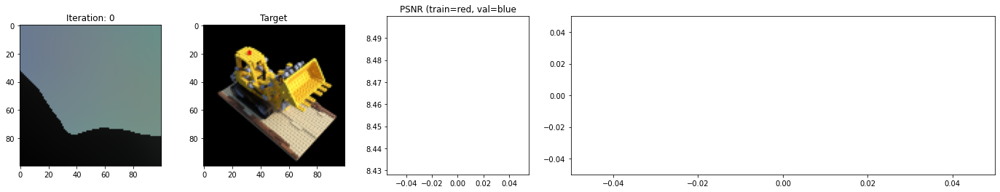

  0%|          | 25/10000 [00:18<1:47:48,  1.54it/s]

Loss: 0.14185714721679688


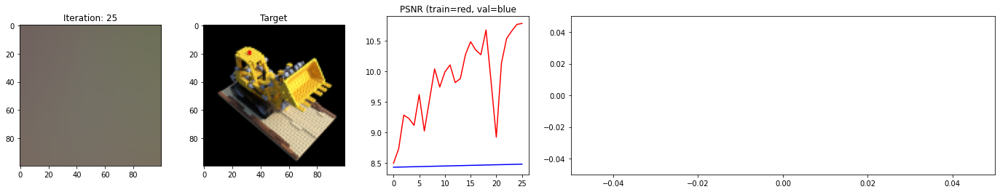

  0%|          | 50/10000 [00:37<1:46:00,  1.56it/s]

Loss: 0.11516721546649933


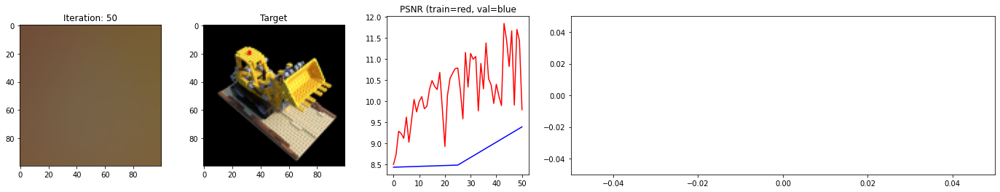

  1%|          | 75/10000 [01:43<7:10:42,  2.60s/it]

Loss: 0.07721710950136185


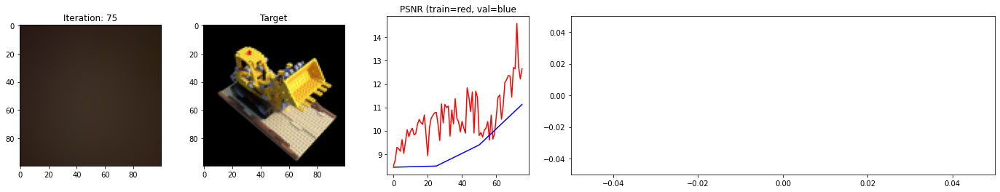

  1%|          | 100/10000 [02:47<7:03:35,  2.57s/it]

Loss: 0.0775567814707756


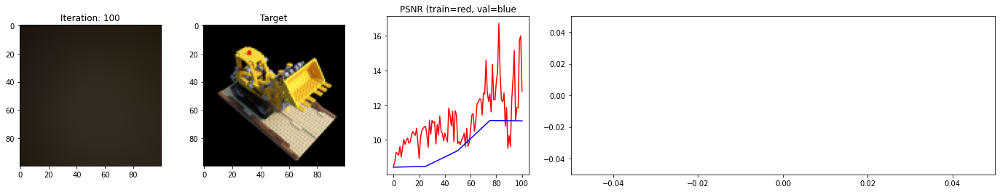

  1%|▏         | 125/10000 [03:51<7:11:15,  2.62s/it]

Loss: 0.07767412066459656


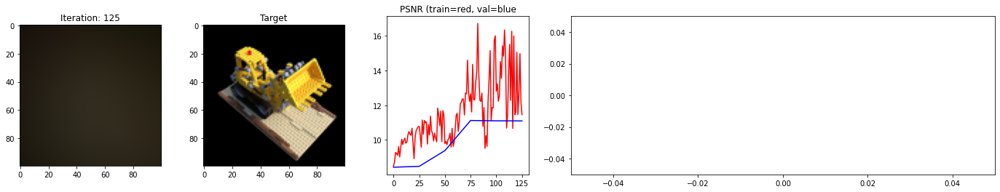

  2%|▏         | 150/10000 [05:00<7:40:52,  2.81s/it]

Loss: 0.07530506700277328


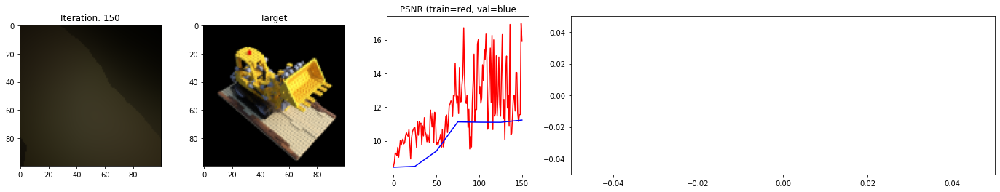

  2%|▏         | 175/10000 [06:04<6:58:01,  2.55s/it]

Loss: 0.0711778923869133


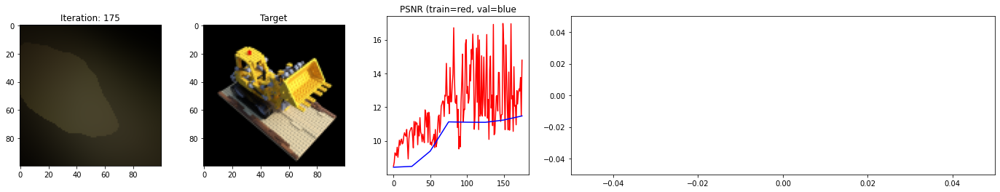

  2%|▏         | 200/10000 [07:13<7:28:05,  2.74s/it]

Loss: 0.06581655144691467


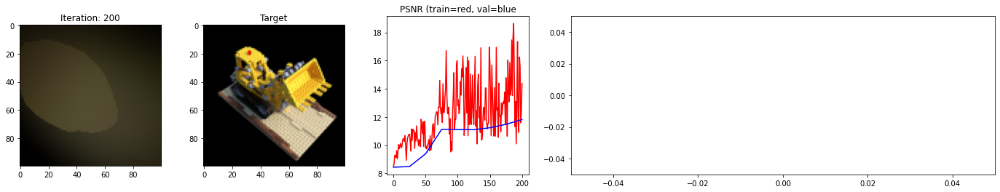

  2%|▏         | 225/10000 [08:17<6:24:36,  2.36s/it]

Loss: 0.06189657375216484


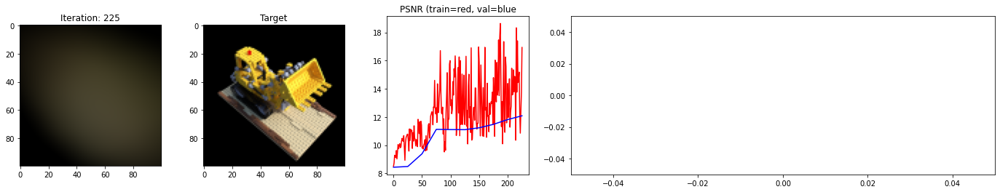

  2%|▎         | 250/10000 [09:21<6:52:53,  2.54s/it]

Loss: 0.058316439390182495


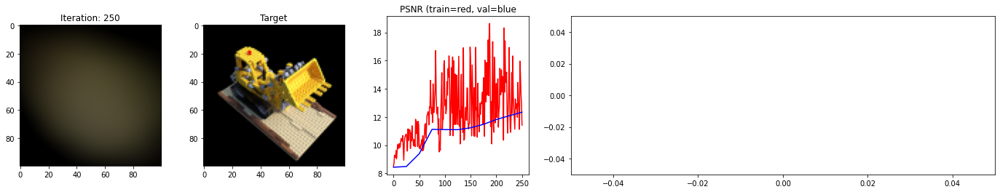

  3%|▎         | 275/10000 [10:27<6:48:50,  2.52s/it]

Loss: 0.05252179875969887


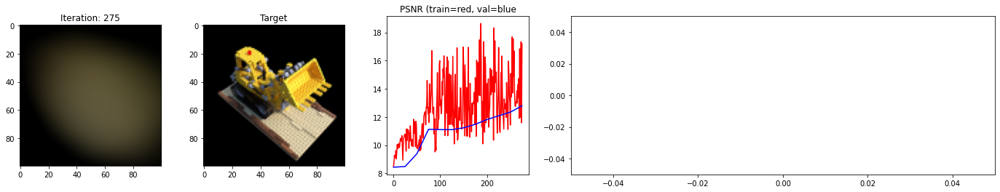

  3%|▎         | 300/10000 [11:32<6:34:51,  2.44s/it]

Loss: 0.04902217909693718


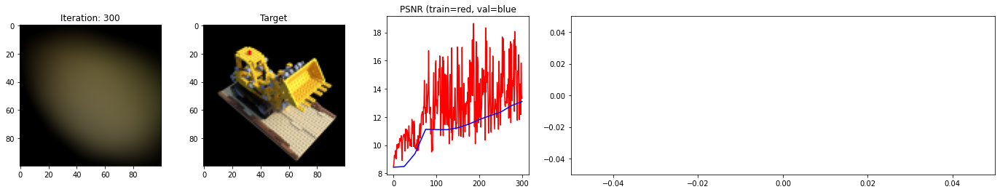

  3%|▎         | 325/10000 [12:37<6:48:29,  2.53s/it]

Loss: 0.045898329466581345


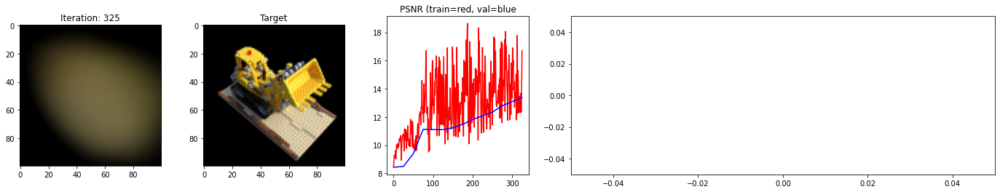

  4%|▎         | 350/10000 [13:43<7:03:43,  2.63s/it]

Loss: 0.043442729860544205


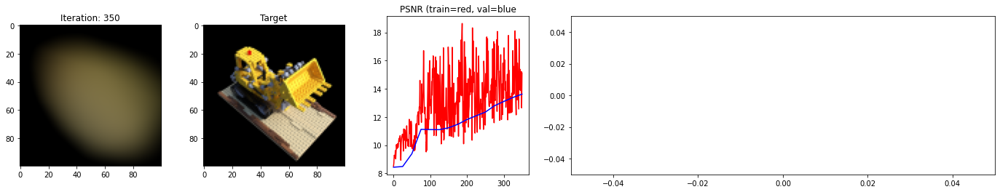

  4%|▍         | 375/10000 [14:52<7:07:38,  2.67s/it]

Loss: 0.043703190982341766


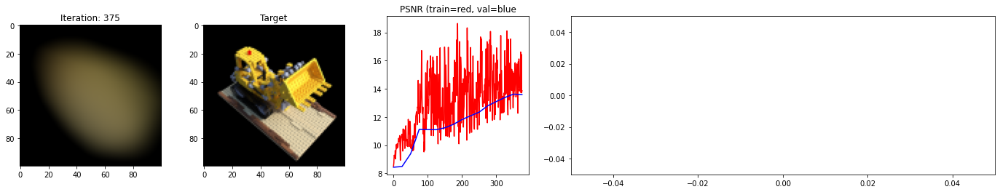

  4%|▍         | 400/10000 [15:59<6:55:21,  2.60s/it]

Loss: 0.040793102234601974


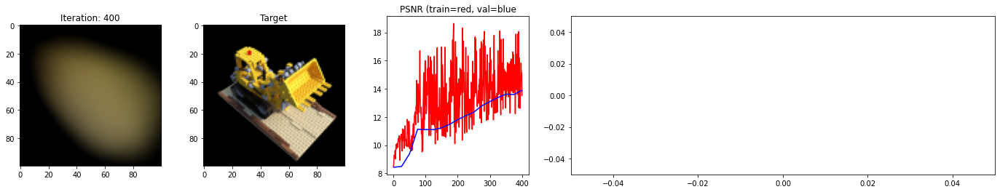

  4%|▍         | 425/10000 [17:09<7:15:53,  2.73s/it]

Loss: 0.04245743900537491


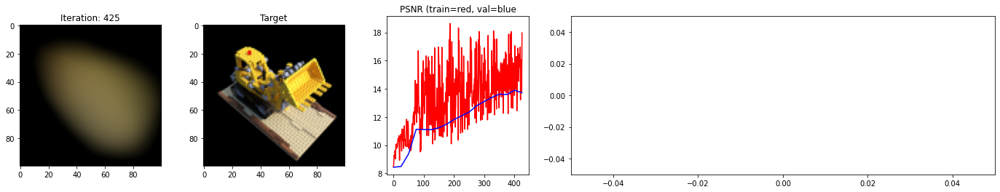

  4%|▍         | 450/10000 [18:17<6:56:05,  2.61s/it]

Loss: 0.042467933148145676


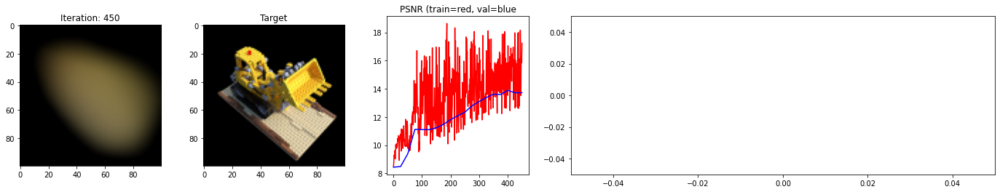

  5%|▍         | 475/10000 [19:24<6:48:39,  2.57s/it]

Loss: 0.0427439846098423


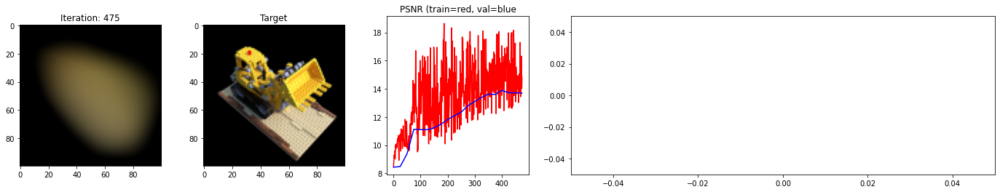

  5%|▌         | 500/10000 [20:30<7:00:10,  2.65s/it]

Loss: 0.04340244457125664


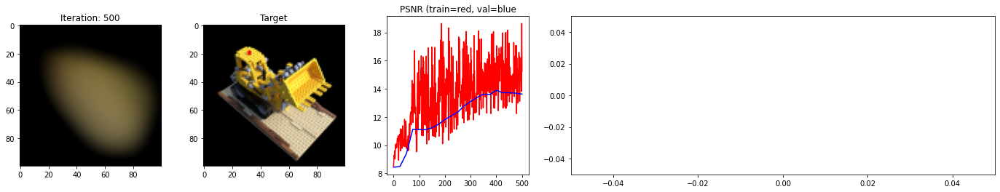

  5%|▌         | 525/10000 [21:38<7:03:25,  2.68s/it]

Loss: 0.04213644936680794


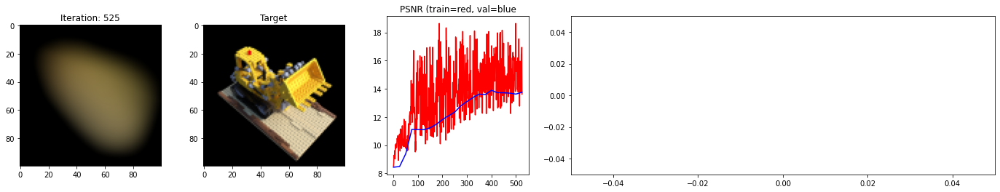

  6%|▌         | 550/10000 [22:46<7:03:56,  2.69s/it]

Loss: 0.04249250888824463


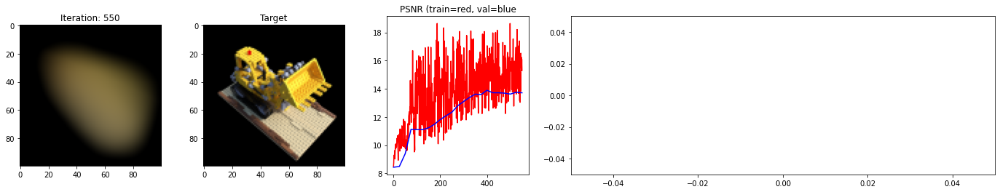

  6%|▌         | 575/10000 [23:53<6:56:07,  2.65s/it]

Loss: 0.03771068528294563


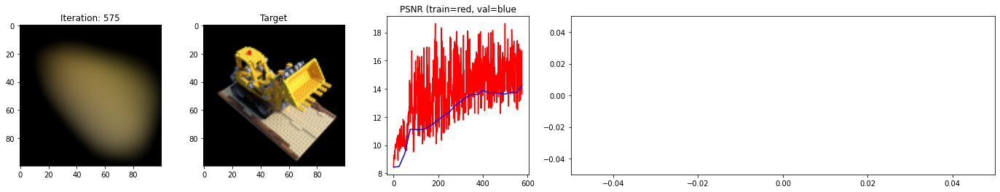

  6%|▌         | 600/10000 [24:57<6:25:54,  2.46s/it]

Loss: 0.03688522055745125


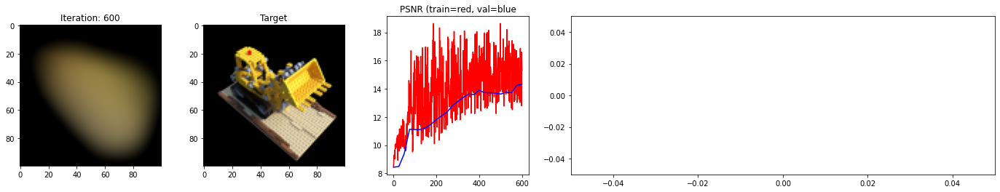

  6%|▋         | 625/10000 [26:05<6:47:59,  2.61s/it]

Loss: 0.03904282674193382


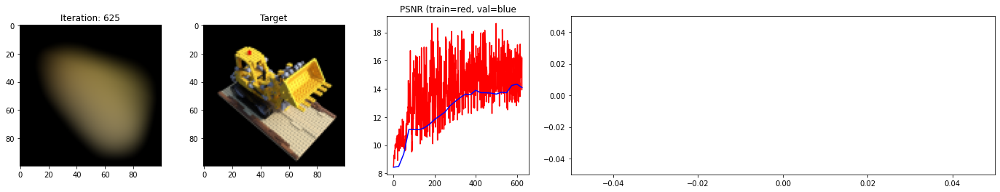

  6%|▋         | 650/10000 [27:11<6:31:48,  2.51s/it]

Loss: 0.03923714905977249


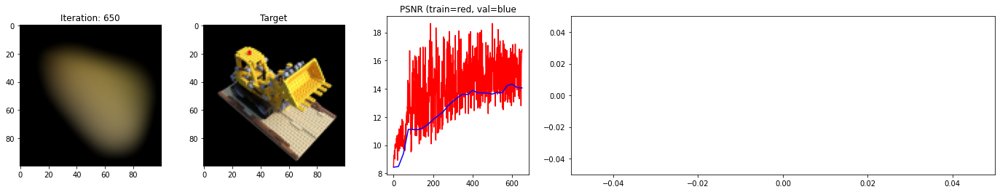

  7%|▋         | 675/10000 [28:17<6:38:22,  2.56s/it]

Loss: 0.03633306175470352


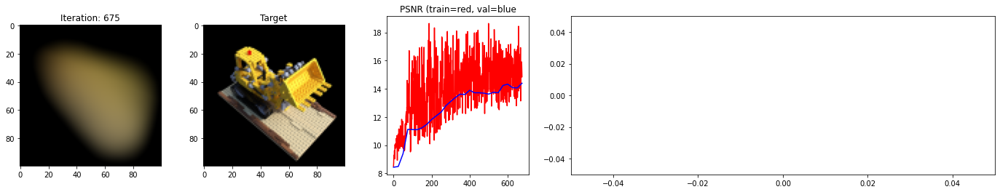

  7%|▋         | 700/10000 [29:24<6:47:53,  2.63s/it]

Loss: 0.035453204065561295


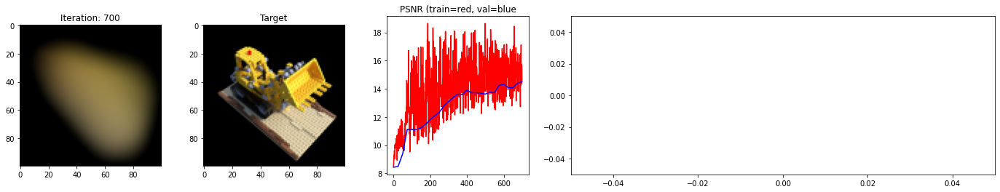

  7%|▋         | 725/10000 [30:30<6:19:26,  2.45s/it]

Loss: 0.03612278774380684


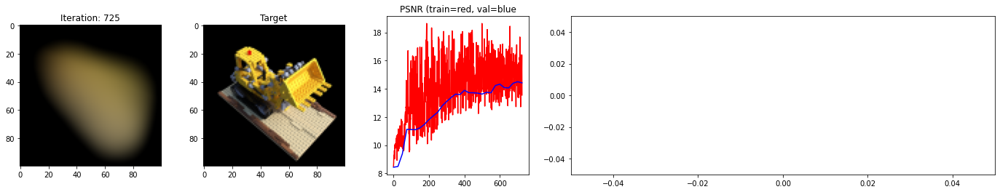

  8%|▊         | 750/10000 [31:36<6:35:57,  2.57s/it]

Loss: 0.03514350578188896


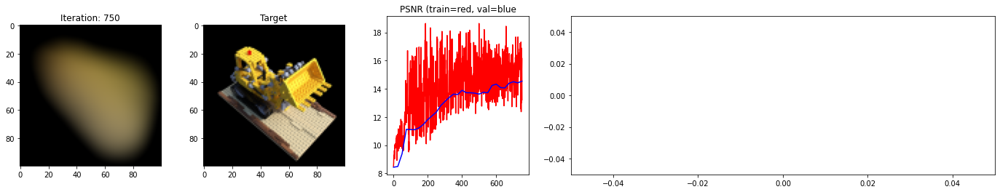

  8%|▊         | 775/10000 [32:42<6:27:36,  2.52s/it]

Loss: 0.03575000911951065


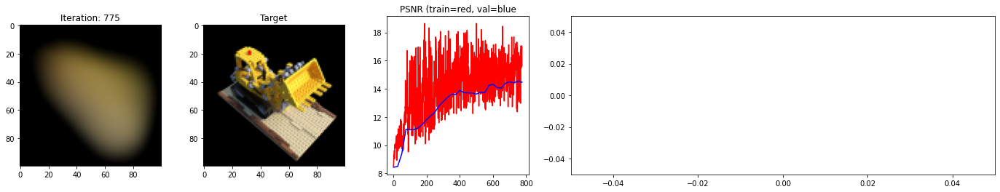

  8%|▊         | 800/10000 [33:48<6:39:44,  2.61s/it]

Loss: 0.04272950813174248


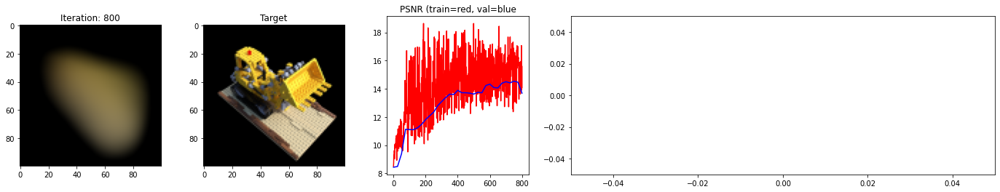

  8%|▊         | 825/10000 [34:54<6:21:28,  2.49s/it]

Loss: 0.04187280312180519


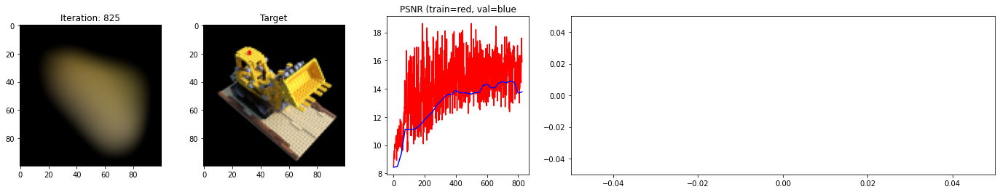

  8%|▊         | 850/10000 [36:03<6:50:23,  2.69s/it]

Loss: 0.03384837508201599


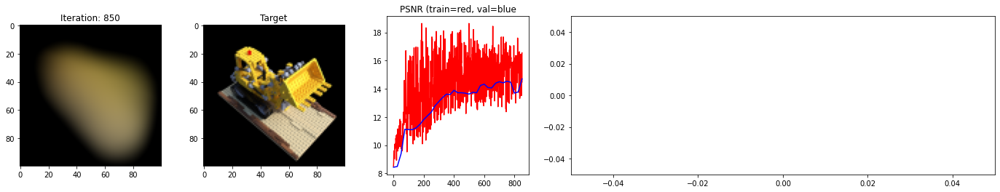

  9%|▉         | 875/10000 [37:09<6:13:20,  2.45s/it]

Loss: 0.037441764026880264


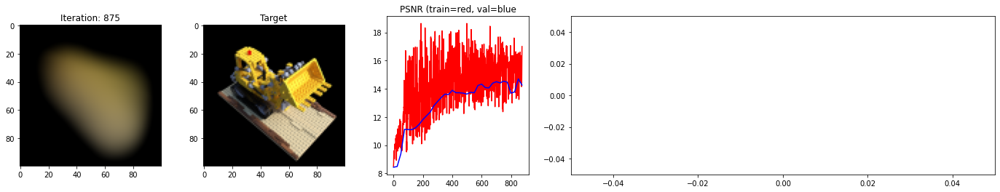

  9%|▉         | 900/10000 [38:16<6:37:23,  2.62s/it]

Loss: 0.040979914367198944


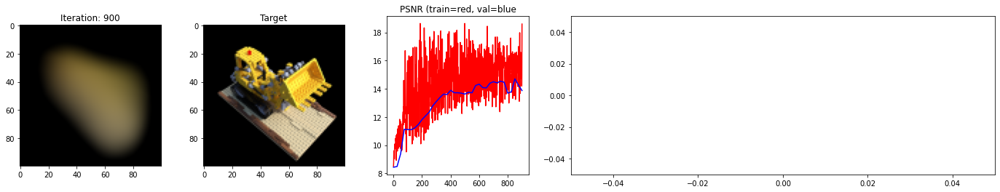

  9%|▉         | 925/10000 [39:22<6:22:59,  2.53s/it]

Loss: 0.033370938152074814


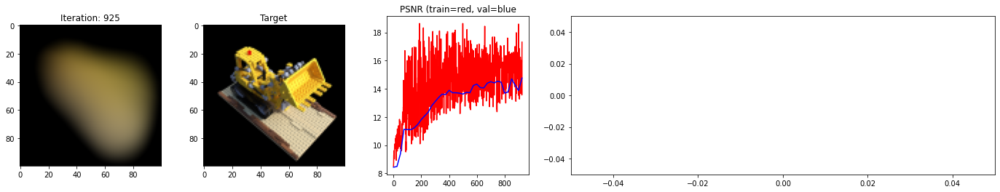

 10%|▉         | 950/10000 [40:30<6:41:09,  2.66s/it]

Loss: 0.033497028052806854


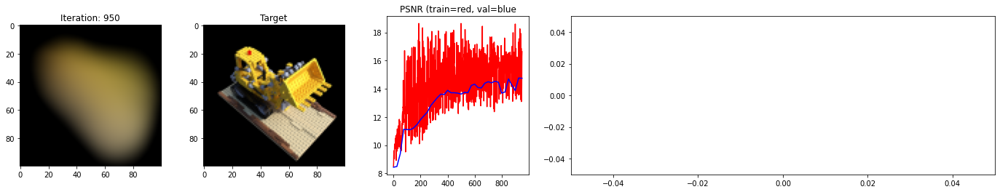

 10%|▉         | 975/10000 [41:39<6:33:49,  2.62s/it]

Loss: 0.03409797325730324


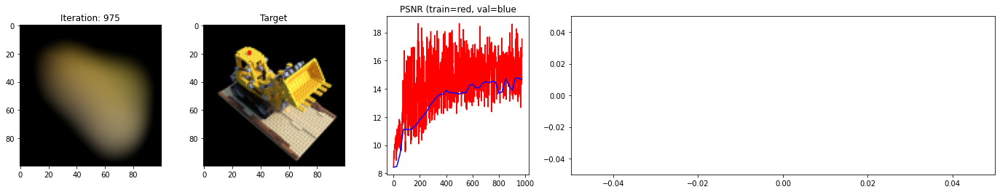

 10%|█         | 1000/10000 [42:45<6:28:19,  2.59s/it]

Loss: 0.03208284080028534


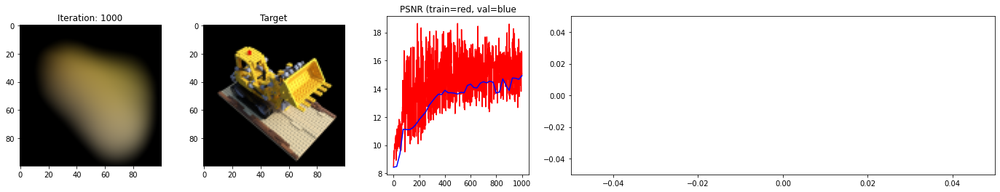

 10%|█         | 1025/10000 [43:50<6:19:15,  2.54s/it]

Loss: 0.03322575241327286


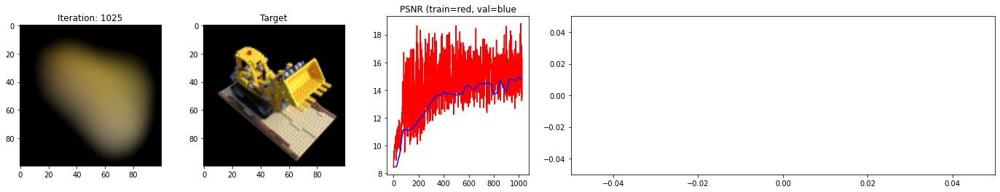

 10%|█         | 1050/10000 [44:56<6:37:54,  2.67s/it]

Loss: 0.03238901495933533


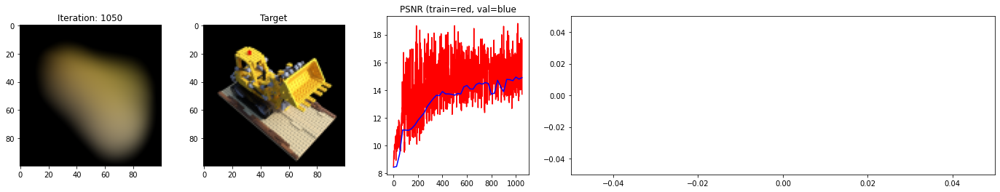

 11%|█         | 1075/10000 [46:03<6:12:01,  2.50s/it]

Loss: 0.036301661282777786


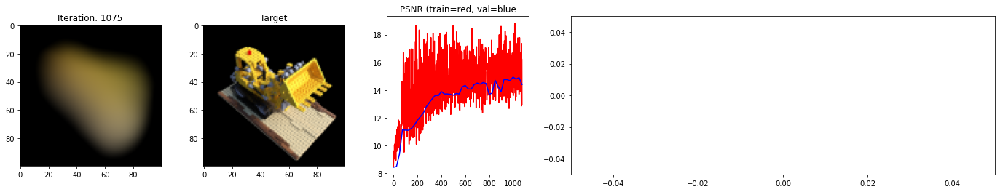

 11%|█         | 1100/10000 [47:06<5:52:50,  2.38s/it]

Loss: 0.03674764558672905


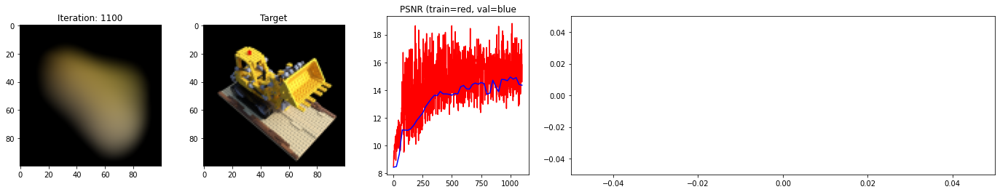

 11%|█▏        | 1125/10000 [48:12<6:07:11,  2.48s/it]

Loss: 0.03263372555375099


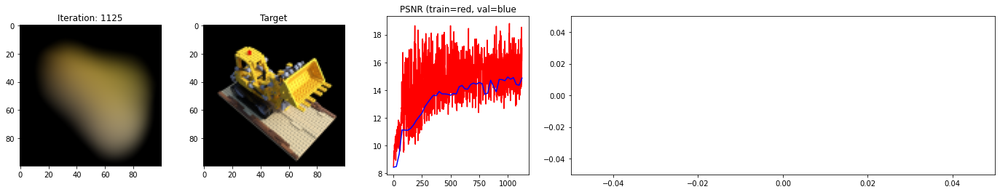

 12%|█▏        | 1150/10000 [49:16<6:22:21,  2.59s/it]

Loss: 0.03313257545232773


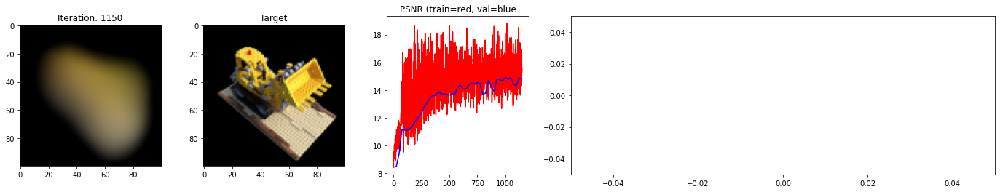

 12%|█▏        | 1175/10000 [50:22<6:01:51,  2.46s/it]

Loss: 0.034015290439128876


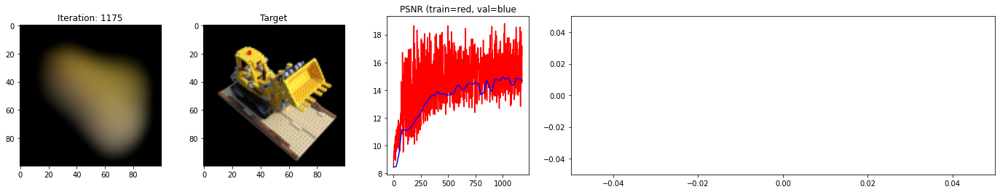

 12%|█▏        | 1200/10000 [51:28<6:21:25,  2.60s/it]

Loss: 0.03822598233819008


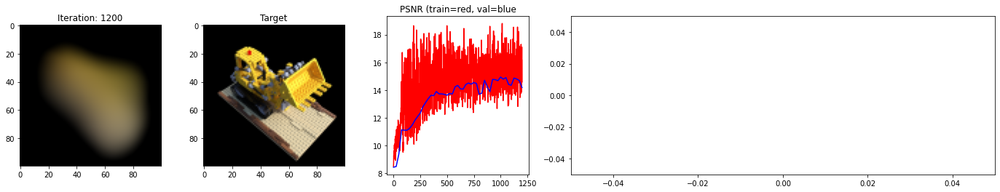

 12%|█▏        | 1225/10000 [52:33<6:07:46,  2.51s/it]

Loss: 0.03304746374487877


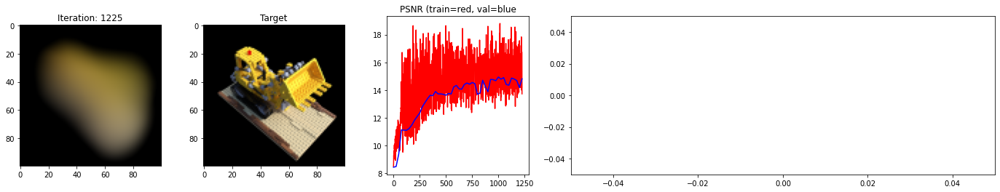

 12%|█▎        | 1250/10000 [53:39<6:31:10,  2.68s/it]

Loss: 0.039364151656627655


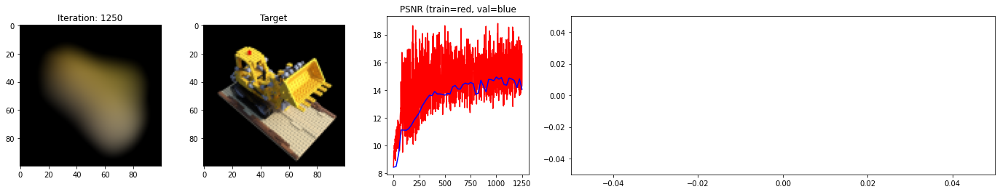

 13%|█▎        | 1275/10000 [54:47<6:18:45,  2.60s/it]

Loss: 0.034983936697244644


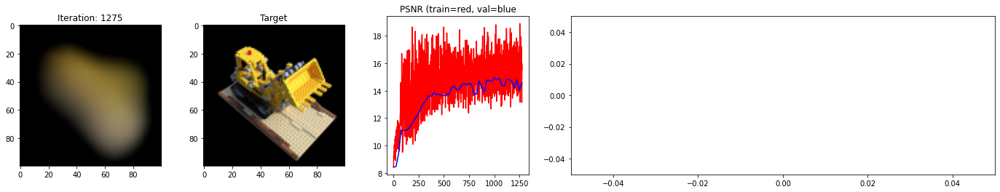

 13%|█▎        | 1300/10000 [55:56<6:31:26,  2.70s/it]

Loss: 0.03679787740111351


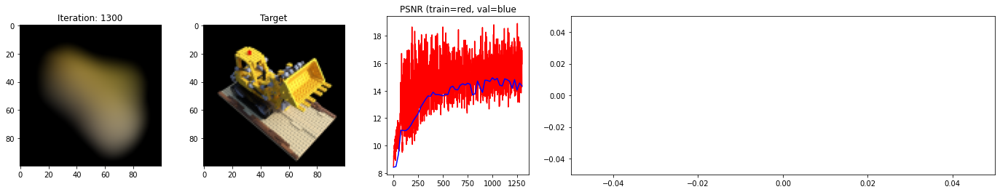

 13%|█▎        | 1325/10000 [57:02<6:13:59,  2.59s/it]

Loss: 0.0361282154917717


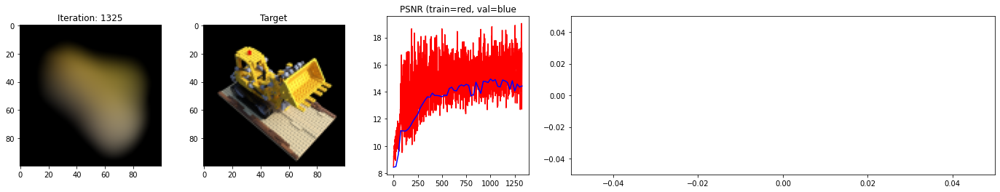

 14%|█▎        | 1350/10000 [58:09<6:01:01,  2.50s/it]

Loss: 0.032537348568439484


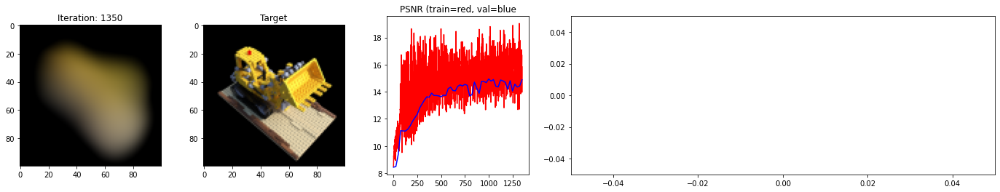

 14%|█▍        | 1375/10000 [59:18<6:39:18,  2.78s/it]

Loss: 0.03551996499300003


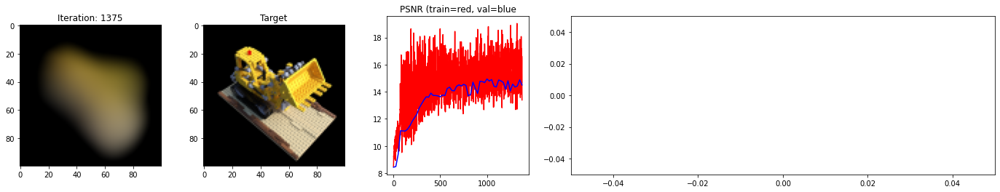

 14%|█▍        | 1400/10000 [1:00:26<6:24:23,  2.68s/it]

Loss: 0.03221261501312256


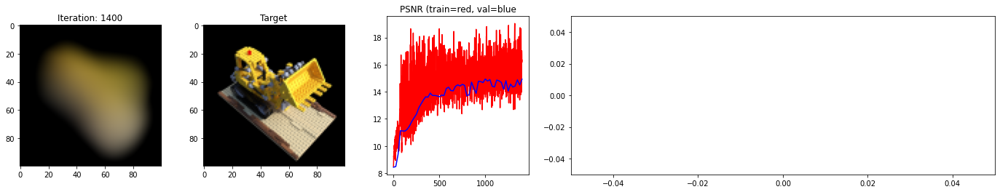

 14%|█▍        | 1425/10000 [1:01:32<6:09:17,  2.58s/it]

Loss: 0.03700994327664375


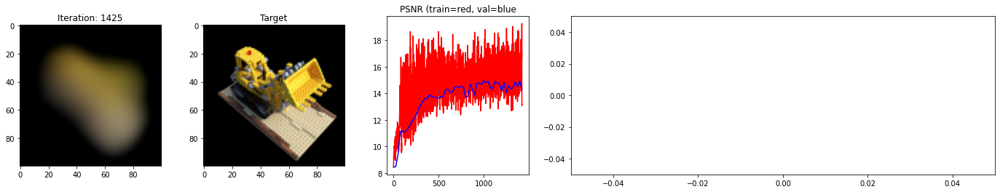

 14%|█▍        | 1450/10000 [1:02:38<6:09:23,  2.59s/it]

Loss: 0.03906179219484329


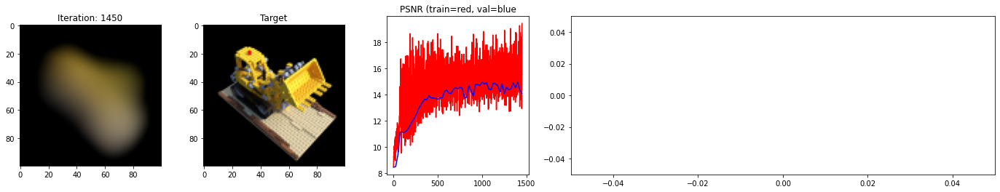

 15%|█▍        | 1475/10000 [1:03:47<6:19:05,  2.67s/it]

Loss: 0.03788832202553749


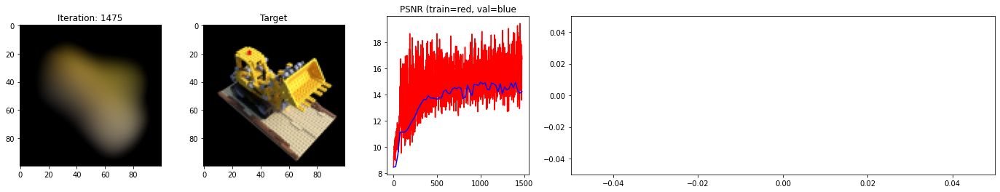

 15%|█▌        | 1500/10000 [1:04:53<5:48:46,  2.46s/it]

Loss: 0.029939843341708183


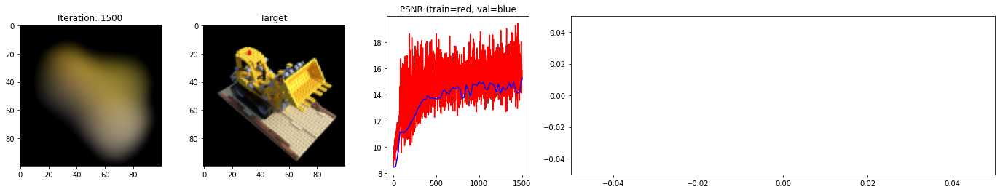

 15%|█▌        | 1525/10000 [1:05:57<5:42:07,  2.42s/it]

Loss: 0.029930714517831802


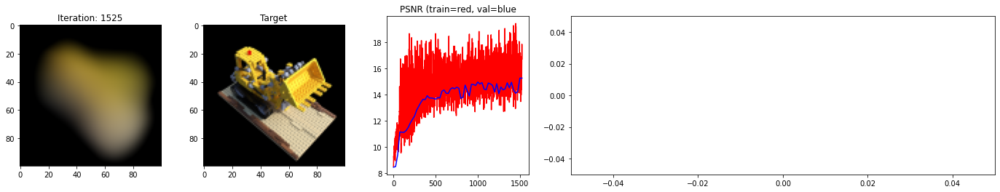

 16%|█▌        | 1550/10000 [1:06:59<5:40:36,  2.42s/it]

Loss: 0.028808342292904854


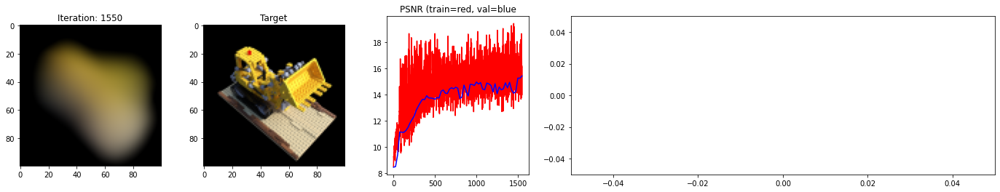

 16%|█▌        | 1575/10000 [1:08:03<5:57:44,  2.55s/it]

Loss: 0.029177000746130943


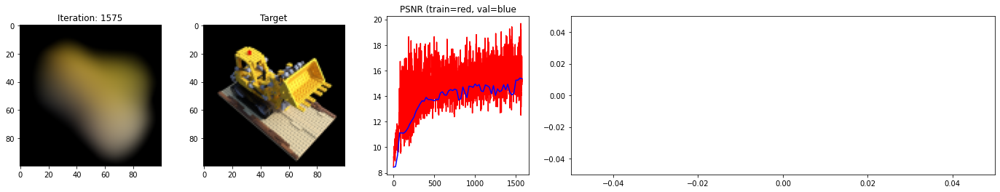

 16%|█▌        | 1600/10000 [1:09:08<5:41:14,  2.44s/it]

Loss: 0.029664289206266403


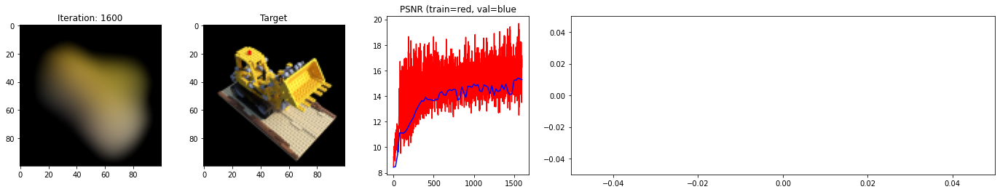

 16%|█▋        | 1625/10000 [1:10:13<5:44:37,  2.47s/it]

Loss: 0.02903110720217228


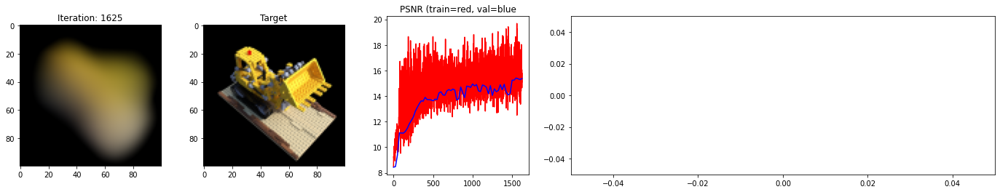

 16%|█▋        | 1650/10000 [1:11:15<5:31:37,  2.38s/it]

Loss: 0.03214696794748306


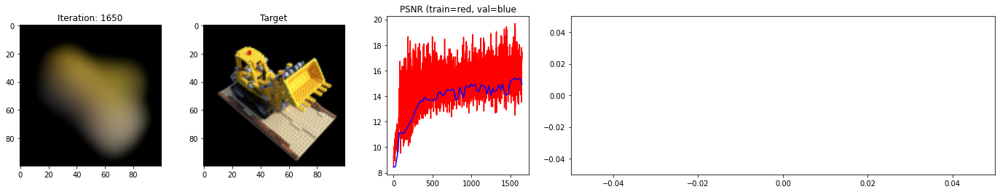

 17%|█▋        | 1675/10000 [1:12:20<6:02:17,  2.61s/it]

Loss: 0.030032537877559662


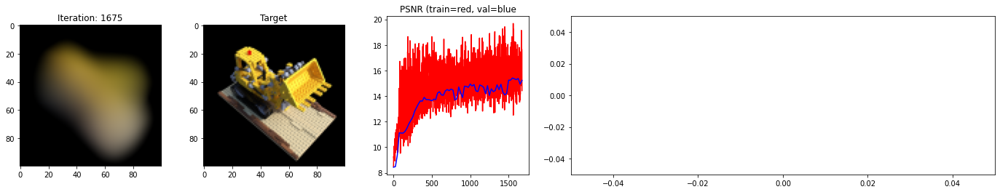

 17%|█▋        | 1700/10000 [1:13:24<5:45:59,  2.50s/it]

Loss: 0.032016512006521225


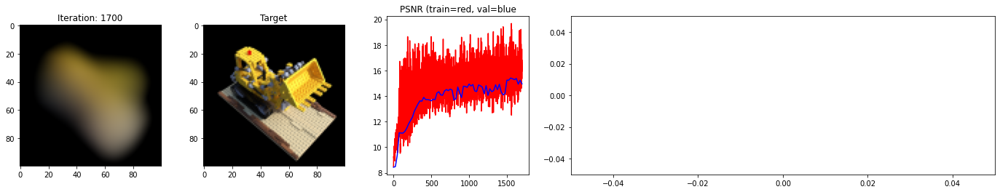

 17%|█▋        | 1725/10000 [1:14:30<5:41:55,  2.48s/it]

Loss: 0.030820021405816078


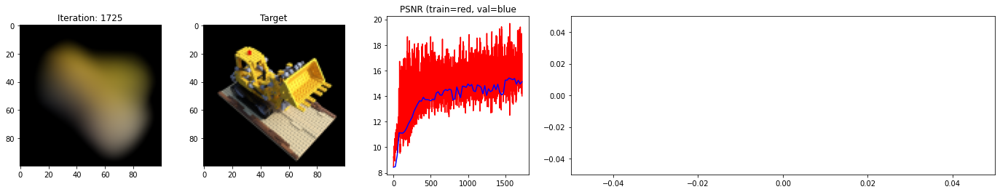

 18%|█▊        | 1750/10000 [1:15:33<5:33:11,  2.42s/it]

Loss: 0.033079832792282104


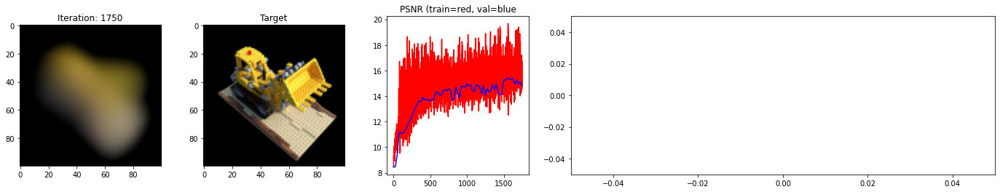

 18%|█▊        | 1775/10000 [1:16:37<6:11:25,  2.71s/it]

Loss: 0.029043469578027725


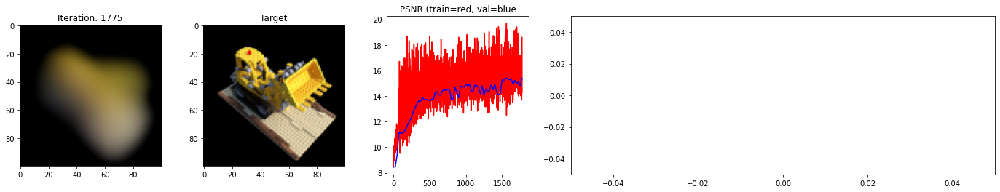

 18%|█▊        | 1800/10000 [1:17:40<5:28:06,  2.40s/it]

Loss: 0.027736738324165344


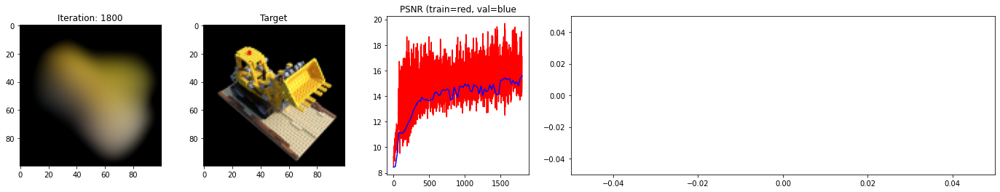

 18%|█▊        | 1825/10000 [1:18:42<5:39:03,  2.49s/it]

Loss: 0.026899304240942


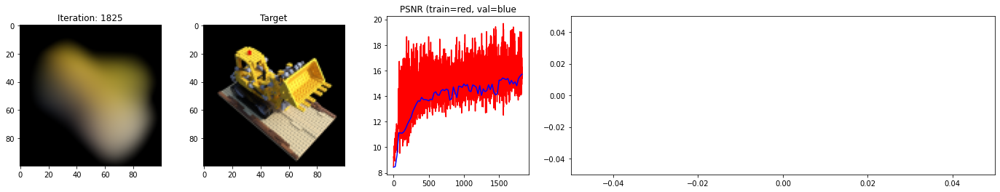

 18%|█▊        | 1850/10000 [1:19:44<5:26:15,  2.40s/it]

Loss: 0.03493887186050415


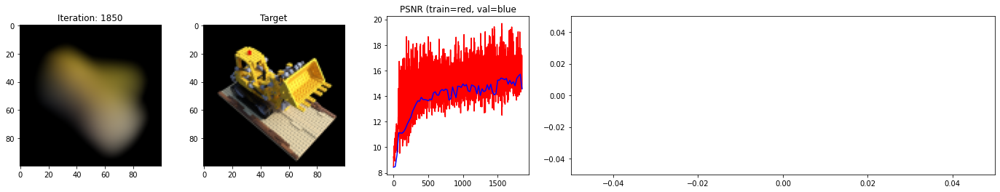

 19%|█▉        | 1875/10000 [1:20:52<5:40:49,  2.52s/it]

Loss: 0.031842634081840515


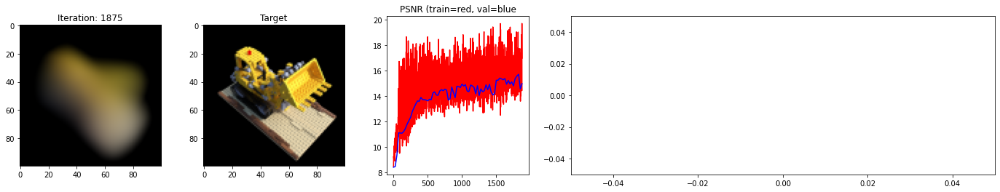

 19%|█▉        | 1900/10000 [1:21:53<5:23:12,  2.39s/it]

Loss: 0.03364155441522598


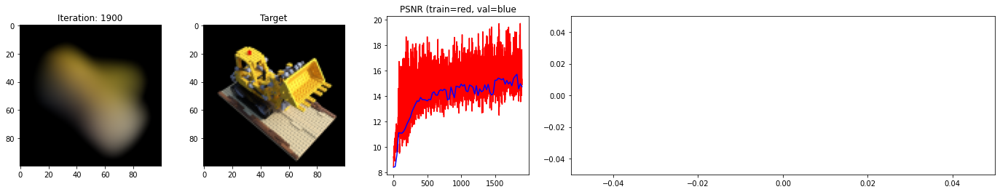

 19%|█▉        | 1925/10000 [1:22:58<6:19:03,  2.82s/it]

Loss: 0.033211030066013336


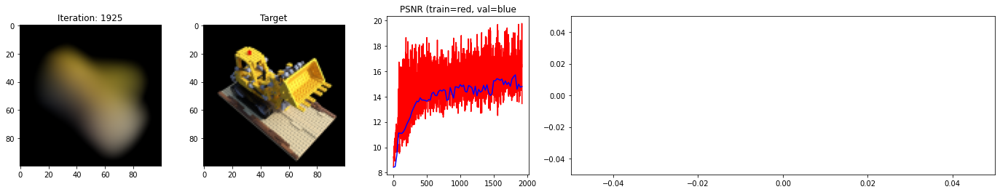

 20%|█▉        | 1950/10000 [1:24:05<5:58:00,  2.67s/it]

Loss: 0.027248479425907135


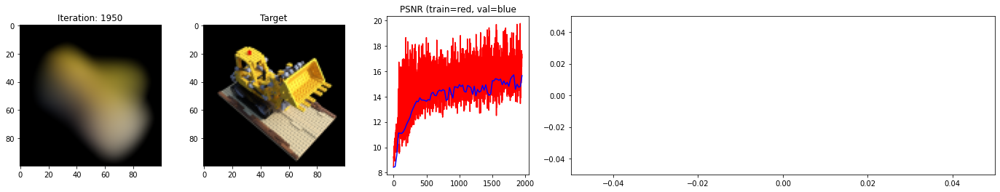

 20%|█▉        | 1975/10000 [1:25:12<5:54:23,  2.65s/it]

Loss: 0.0273437537252903


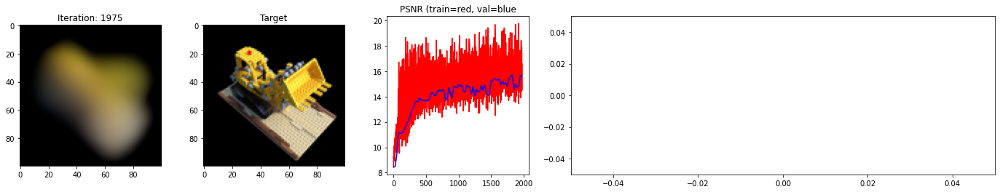

 20%|██        | 2000/10000 [1:26:18<5:48:11,  2.61s/it]

Loss: 0.028291188180446625


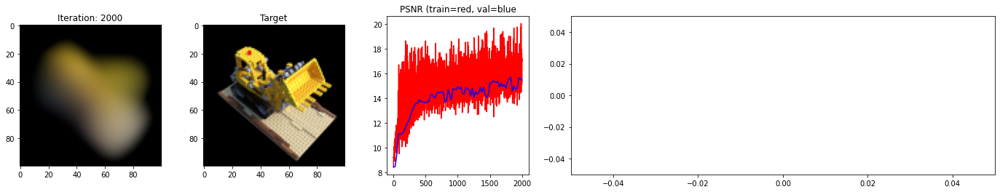

 20%|██        | 2025/10000 [1:27:20<5:37:34,  2.54s/it]

Loss: 0.028299696743488312


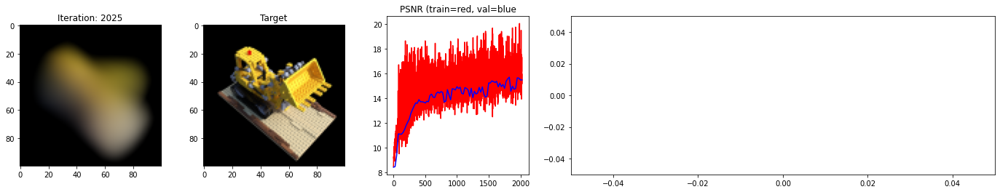

 20%|██        | 2050/10000 [1:28:21<5:12:09,  2.36s/it]

Loss: 0.03089253418147564


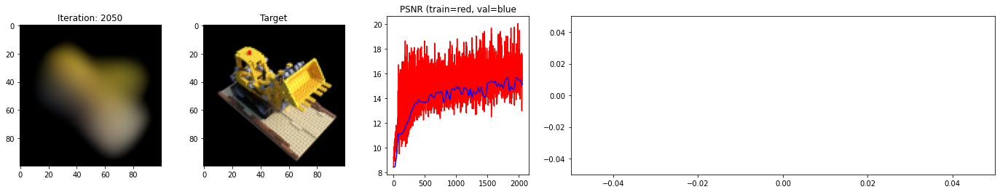

 21%|██        | 2075/10000 [1:29:23<5:34:50,  2.54s/it]

Loss: 0.03237779811024666


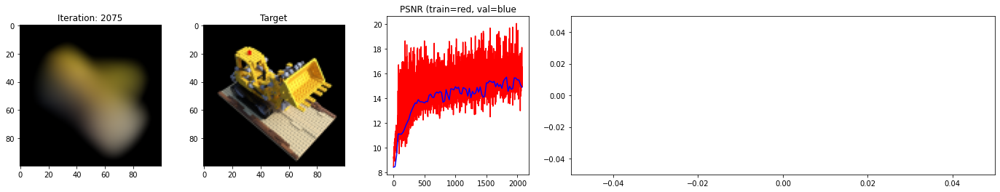

 21%|██        | 2100/10000 [1:30:24<5:14:12,  2.39s/it]

Loss: 0.026021189987659454


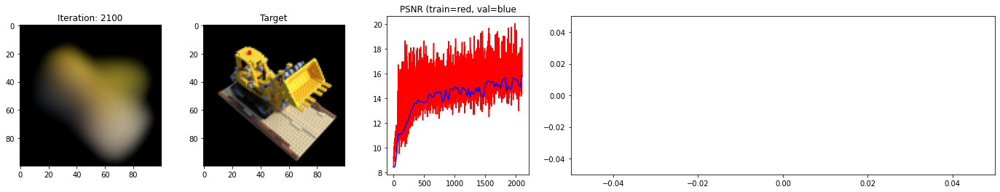

 21%|██▏       | 2125/10000 [1:31:25<5:09:56,  2.36s/it]

Loss: 0.030333664268255234


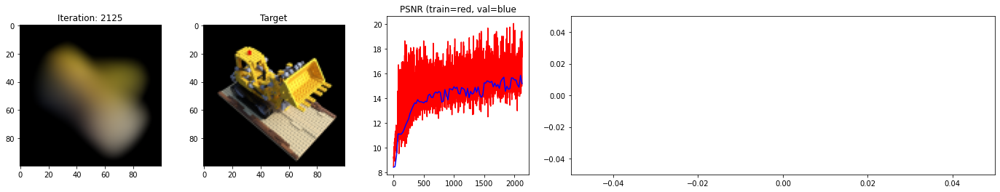

 22%|██▏       | 2150/10000 [1:32:27<5:08:32,  2.36s/it]

Loss: 0.02900911681354046


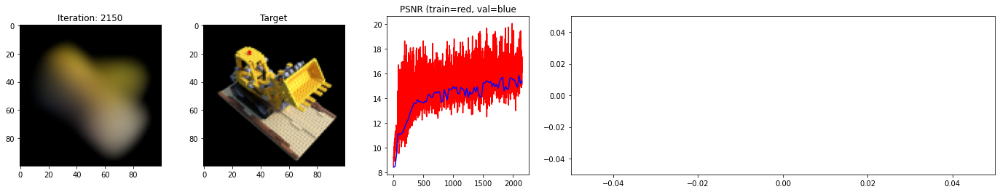

 22%|██▏       | 2175/10000 [1:33:27<5:06:36,  2.35s/it]

Loss: 0.028111165389418602


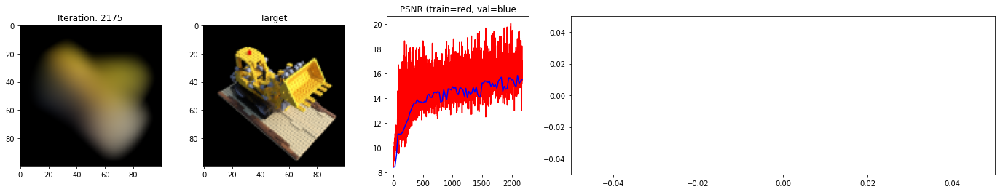

 22%|██▏       | 2200/10000 [1:34:29<5:07:39,  2.37s/it]

Loss: 0.03072681650519371


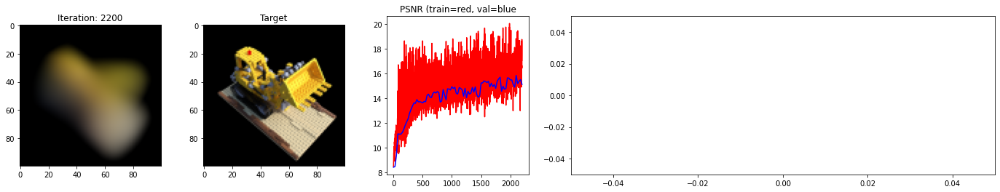

 22%|██▏       | 2225/10000 [1:35:34<5:55:07,  2.74s/it]

Loss: 0.03718903288245201


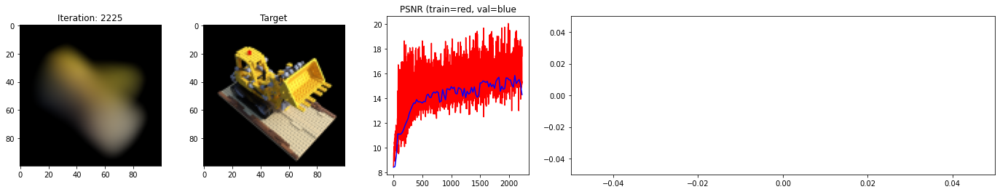

 22%|██▎       | 2250/10000 [1:36:42<5:40:09,  2.63s/it]

Loss: 0.028361713513731956


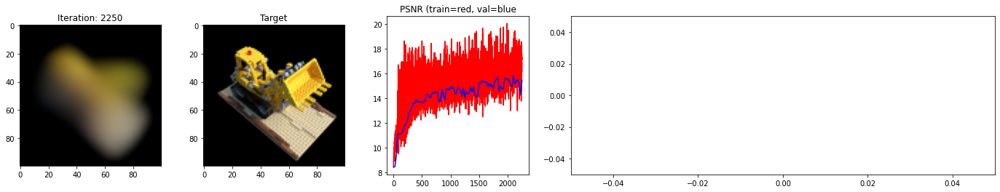

 23%|██▎       | 2275/10000 [1:37:48<5:23:24,  2.51s/it]

Loss: 0.02578682266175747


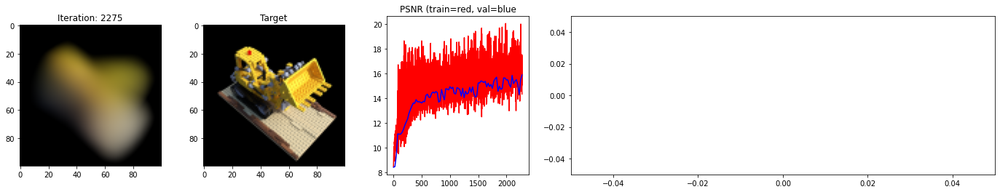

 23%|██▎       | 2300/10000 [1:38:54<5:33:30,  2.60s/it]

Loss: 0.027142275124788284


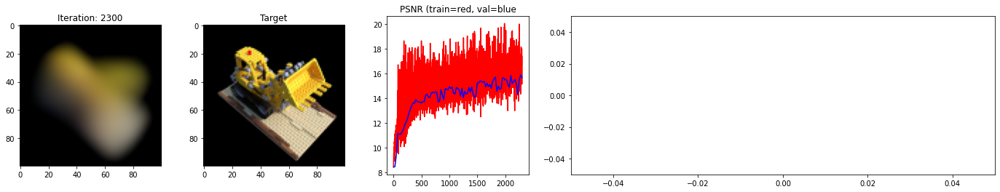

 23%|██▎       | 2325/10000 [1:40:01<5:40:09,  2.66s/it]

Loss: 0.029686445370316505


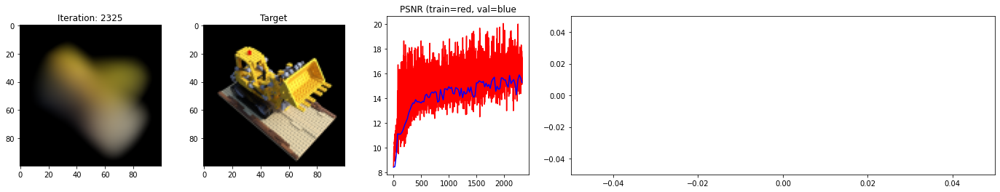

 24%|██▎       | 2350/10000 [1:41:06<5:08:00,  2.42s/it]

Loss: 0.03346451371908188


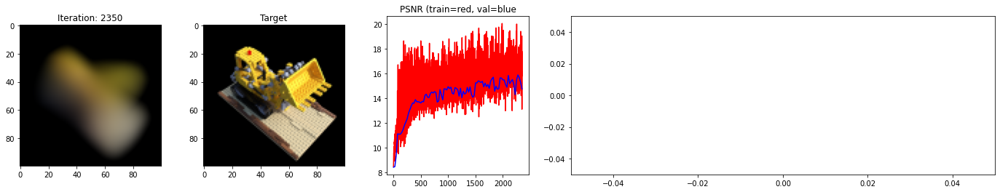

 24%|██▍       | 2375/10000 [1:42:14<5:38:41,  2.67s/it]

Loss: 0.0285699013620615


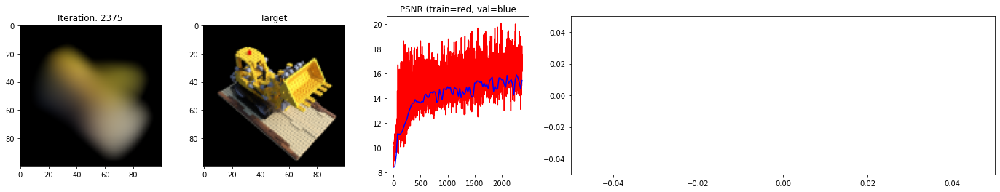

 24%|██▍       | 2400/10000 [1:43:18<5:09:36,  2.44s/it]

Loss: 0.026230625808238983


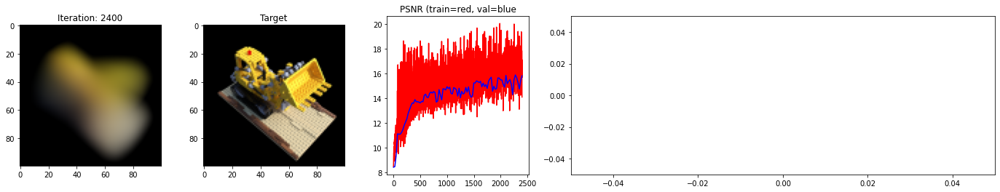

 24%|██▍       | 2425/10000 [1:44:22<5:14:32,  2.49s/it]

Loss: 0.027810854837298393


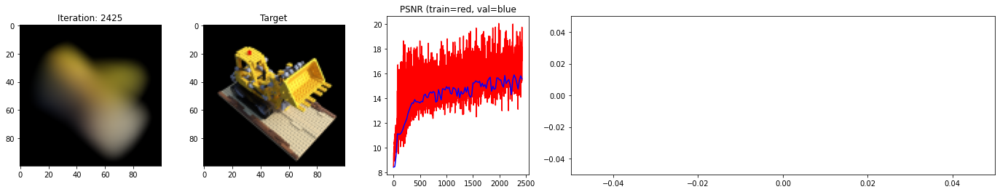

 24%|██▍       | 2450/10000 [1:45:28<5:31:45,  2.64s/it]

Loss: 0.024636341258883476


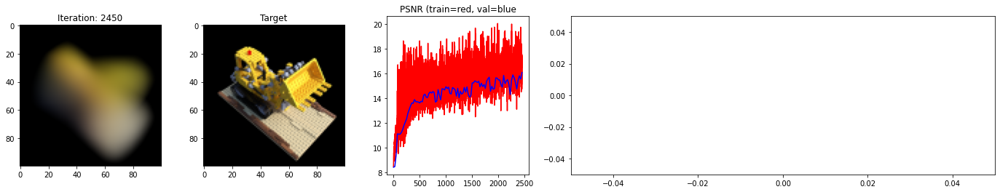

 25%|██▍       | 2475/10000 [1:46:34<5:09:11,  2.47s/it]

Loss: 0.025556745007634163


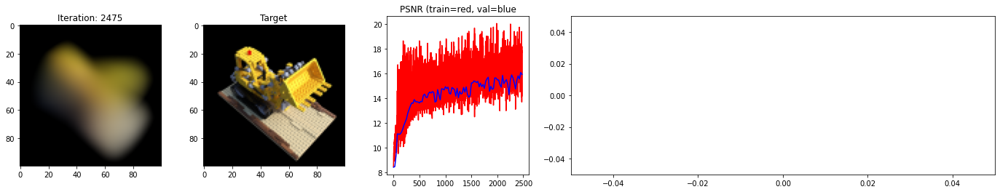

 25%|██▌       | 2500/10000 [1:47:35<4:49:57,  2.32s/it]

Loss: 0.025558486580848694


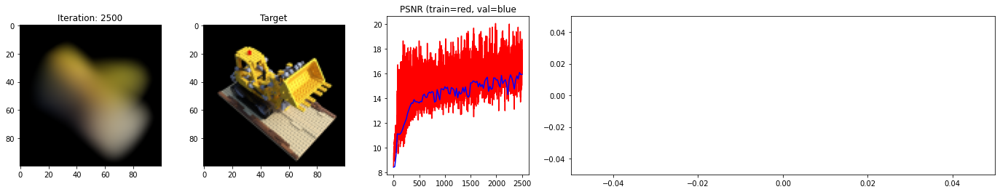

 25%|██▌       | 2525/10000 [1:48:42<5:19:11,  2.56s/it]

Loss: 0.02594720385968685


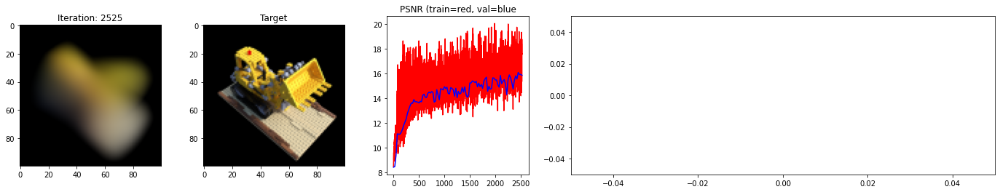

 26%|██▌       | 2550/10000 [1:49:47<5:05:23,  2.46s/it]

Loss: 0.027997156605124474


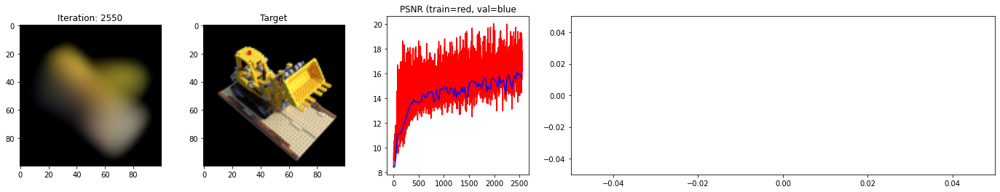

 26%|██▌       | 2575/10000 [1:50:52<5:21:30,  2.60s/it]

Loss: 0.028409769758582115


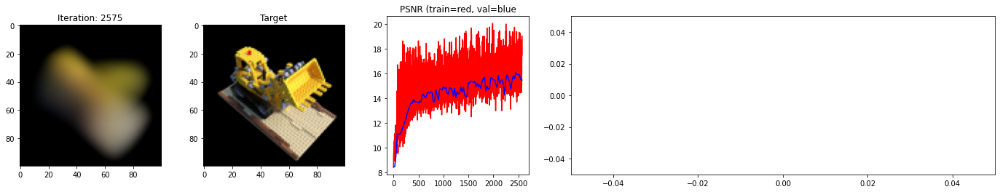

 26%|██▌       | 2600/10000 [1:52:03<6:23:23,  3.11s/it]

Loss: 0.026634883135557175


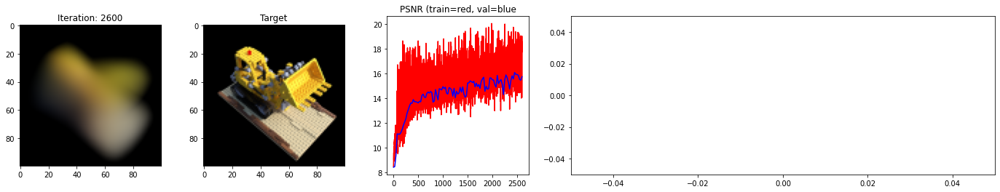

 26%|██▋       | 2625/10000 [1:53:07<5:10:20,  2.52s/it]

Loss: 0.02684921957552433


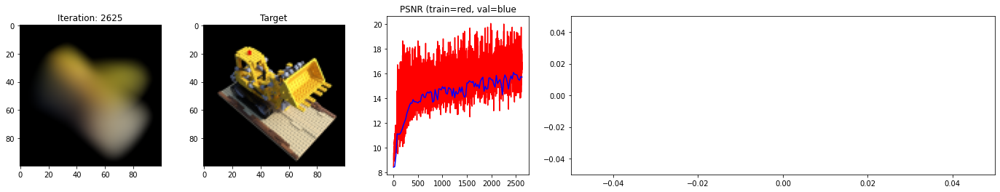

 26%|██▋       | 2650/10000 [1:54:10<4:48:51,  2.36s/it]

Loss: 0.026416588574647903


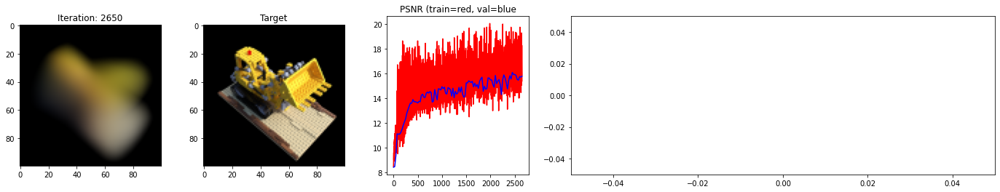

 27%|██▋       | 2675/10000 [1:55:17<5:24:21,  2.66s/it]

Loss: 0.02350488305091858


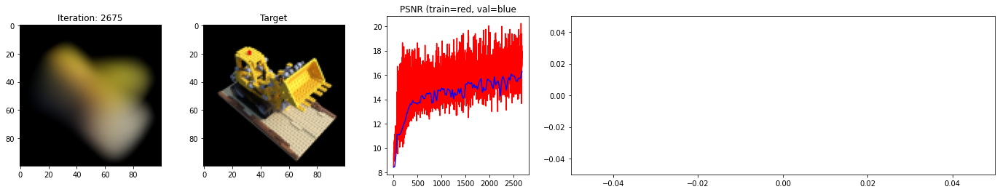

 27%|██▋       | 2700/10000 [1:56:26<5:06:25,  2.52s/it]

Loss: 0.023616764694452286


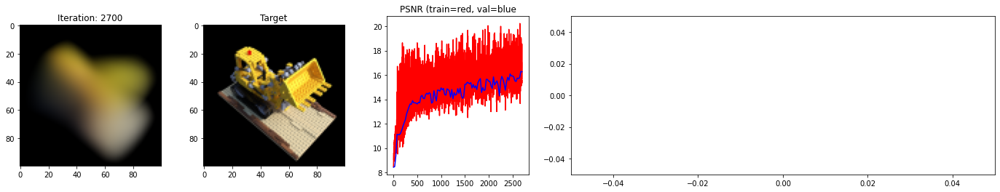

 27%|██▋       | 2725/10000 [1:57:33<5:25:22,  2.68s/it]

Loss: 0.022743986919522285


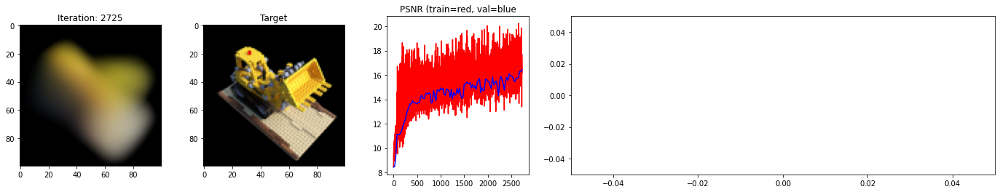

 28%|██▊       | 2750/10000 [1:58:40<5:14:07,  2.60s/it]

Loss: 0.02300497516989708


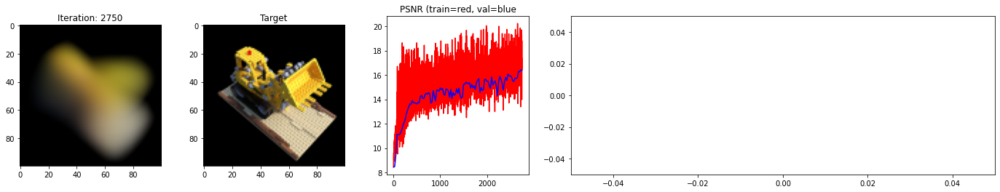

 28%|██▊       | 2775/10000 [1:59:49<5:27:00,  2.72s/it]

Loss: 0.02291819080710411


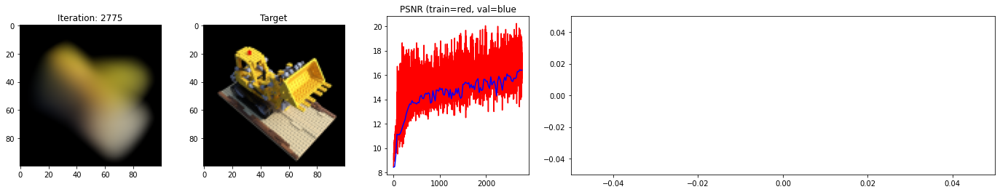

 28%|██▊       | 2800/10000 [2:00:57<5:16:54,  2.64s/it]

Loss: 0.027358779683709145


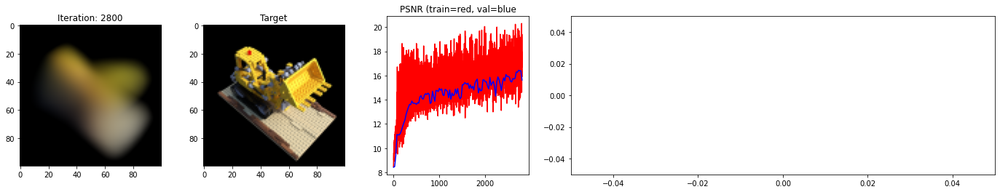

 28%|██▊       | 2825/10000 [2:02:02<5:06:15,  2.56s/it]

Loss: 0.023709358647465706


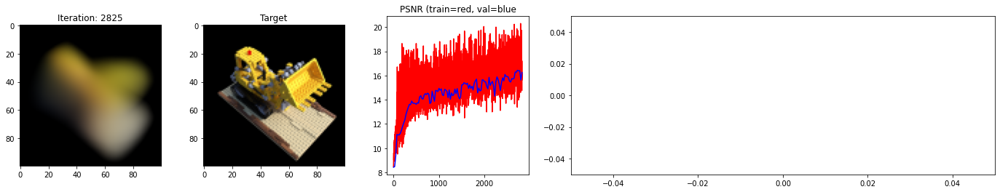

 28%|██▊       | 2850/10000 [2:03:08<5:15:28,  2.65s/it]

Loss: 0.022118892520666122


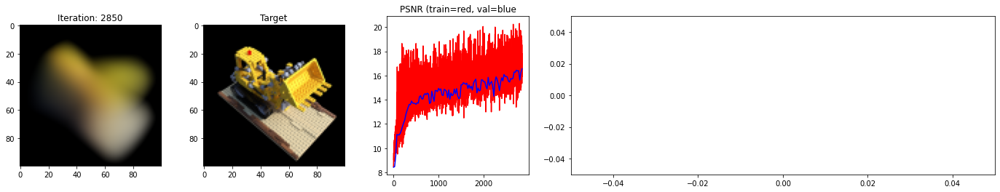

 29%|██▉       | 2875/10000 [2:04:14<5:09:14,  2.60s/it]

Loss: 0.022044548764824867


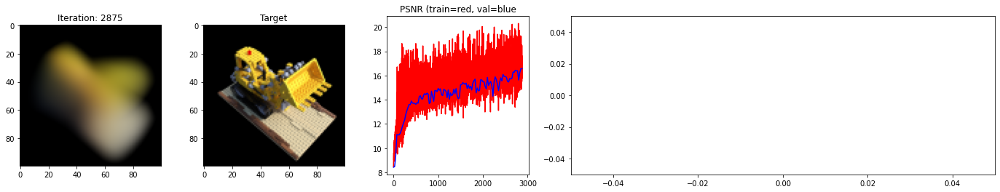

 29%|██▉       | 2900/10000 [2:05:19<4:52:39,  2.47s/it]

Loss: 0.021960197016596794


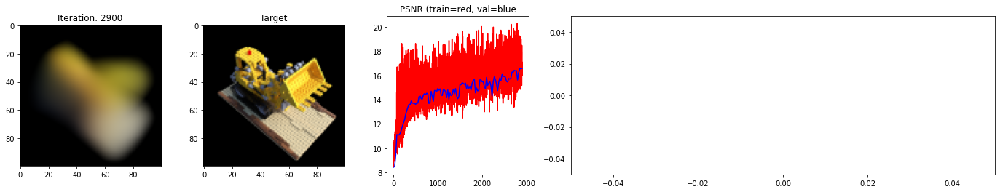

 29%|██▉       | 2925/10000 [2:06:24<4:55:28,  2.51s/it]

Loss: 0.026302501559257507


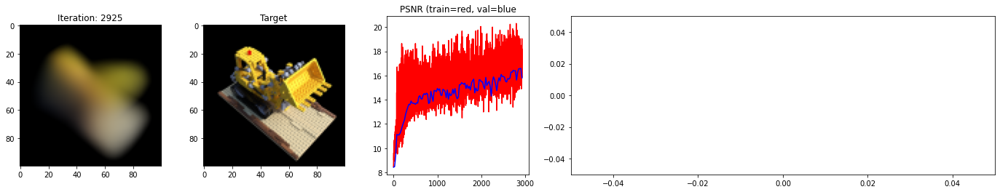

 30%|██▉       | 2950/10000 [2:07:30<4:56:50,  2.53s/it]

Loss: 0.022427305579185486


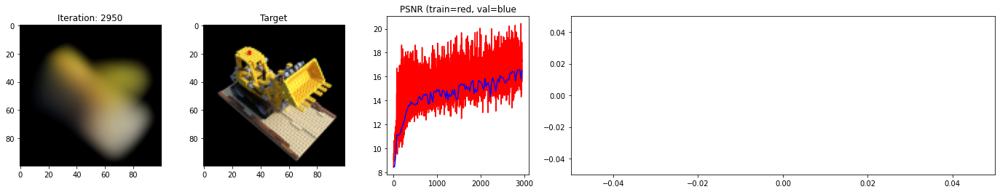

 30%|██▉       | 2975/10000 [2:08:35<4:56:13,  2.53s/it]

Loss: 0.02296697534620762


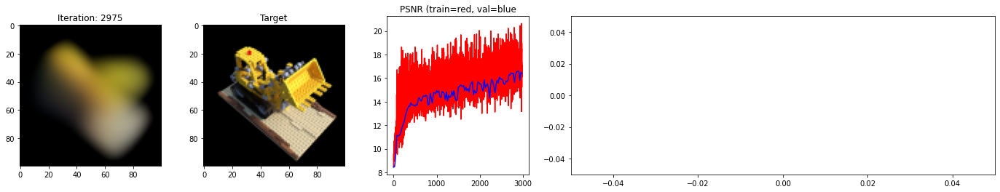

 30%|███       | 3000/10000 [2:09:41<5:01:11,  2.58s/it]

Loss: 0.025530530139803886


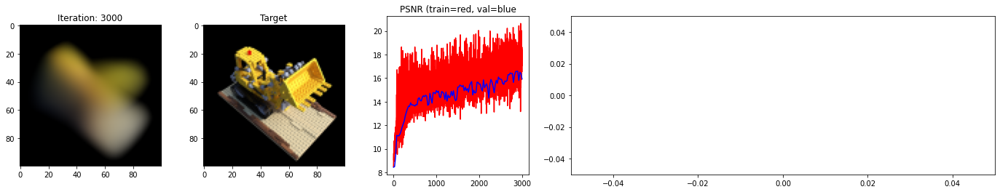

 30%|███       | 3025/10000 [2:10:46<5:00:51,  2.59s/it]

Loss: 0.024076437577605247


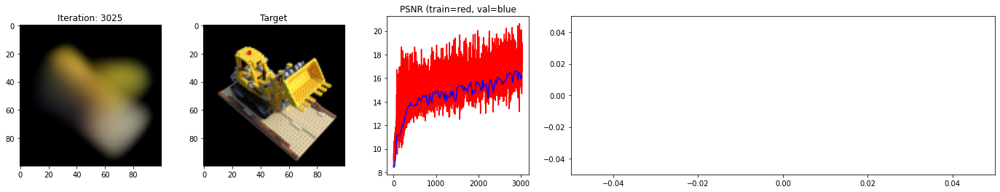

 30%|███       | 3050/10000 [2:11:52<5:05:40,  2.64s/it]

Loss: 0.03015093319118023


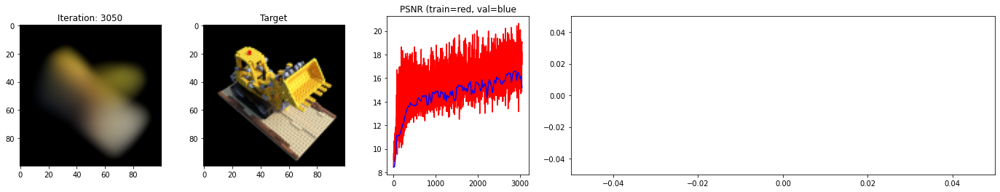

 31%|███       | 3075/10000 [2:12:58<4:51:01,  2.52s/it]

Loss: 0.02505636215209961


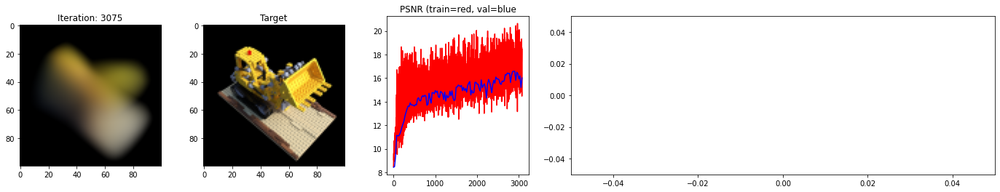

 31%|███       | 3100/10000 [2:14:05<5:06:50,  2.67s/it]

Loss: 0.02344212308526039


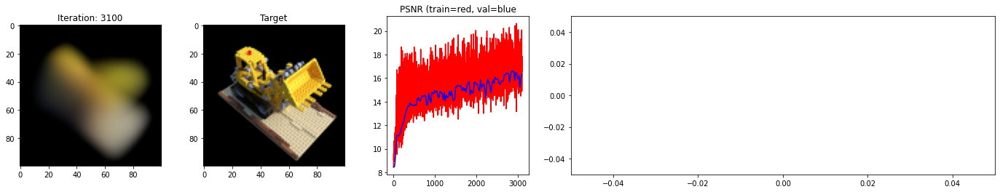

 31%|███▏      | 3125/10000 [2:15:10<4:46:32,  2.50s/it]

Loss: 0.020842889323830605


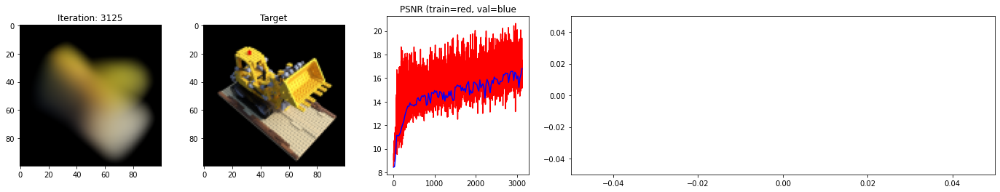

 32%|███▏      | 3150/10000 [2:16:17<4:53:55,  2.57s/it]

Loss: 0.023011837154626846


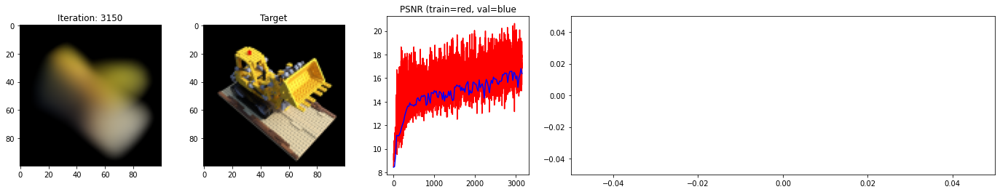

 32%|███▏      | 3175/10000 [2:17:22<4:49:48,  2.55s/it]

Loss: 0.02307099662721157


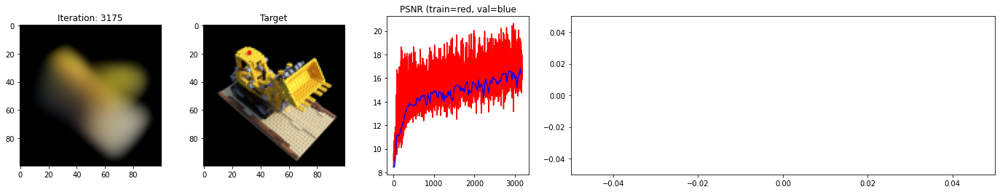

 32%|███▏      | 3200/10000 [2:18:29<4:51:47,  2.57s/it]

Loss: 0.030752655118703842


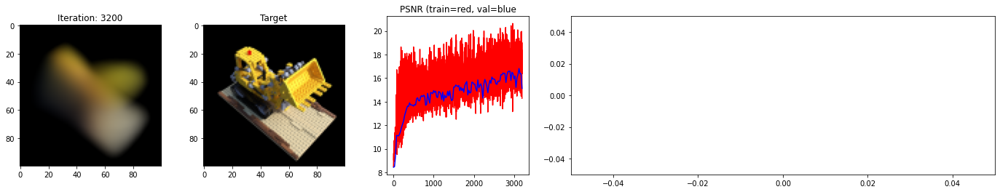

 32%|███▏      | 3225/10000 [2:19:34<4:54:19,  2.61s/it]

Loss: 0.030776185914874077


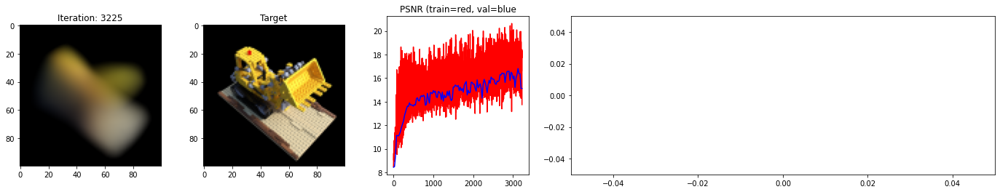

 32%|███▎      | 3250/10000 [2:20:41<4:57:25,  2.64s/it]

Loss: 0.02400987781584263


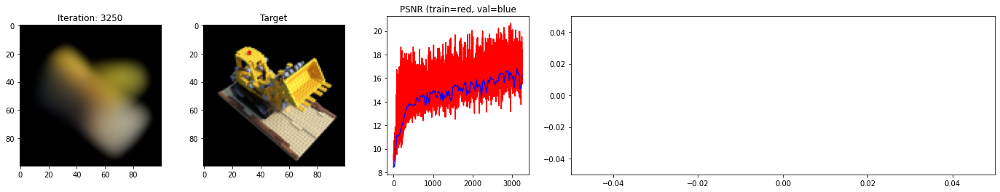

 33%|███▎      | 3275/10000 [2:21:47<4:47:21,  2.56s/it]

Loss: 0.020724371075630188


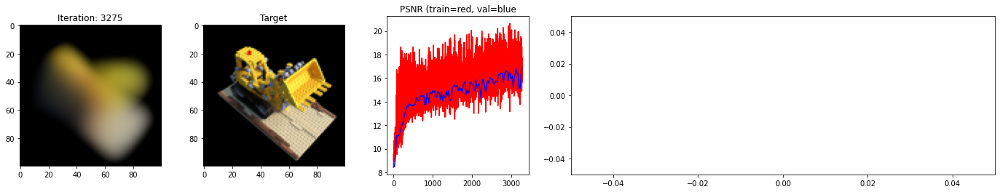

 33%|███▎      | 3300/10000 [2:22:56<5:01:13,  2.70s/it]

Loss: 0.021111365407705307


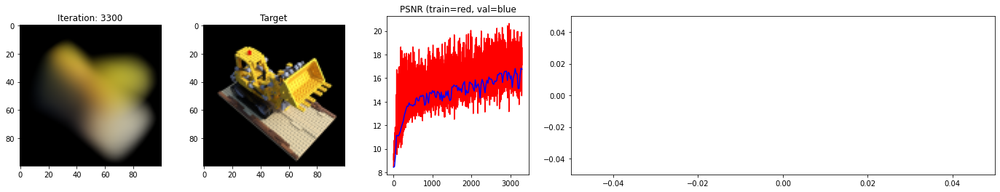

 33%|███▎      | 3325/10000 [2:24:04<4:54:23,  2.65s/it]

Loss: 0.021046875044703484


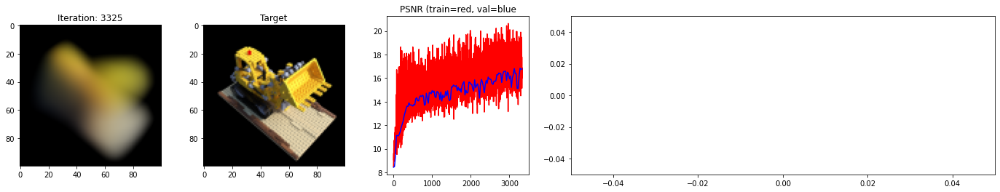

 34%|███▎      | 3350/10000 [2:25:12<5:06:30,  2.77s/it]

Loss: 0.020300889387726784


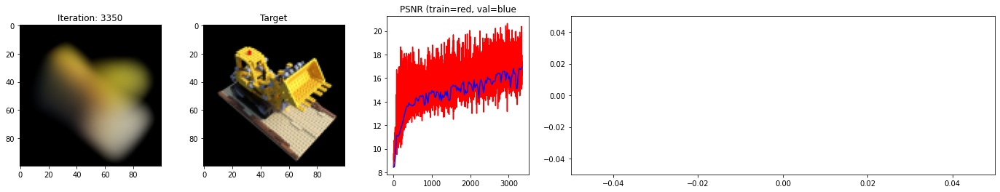

 34%|███▍      | 3375/10000 [2:26:20<4:45:22,  2.58s/it]

Loss: 0.020272383466362953


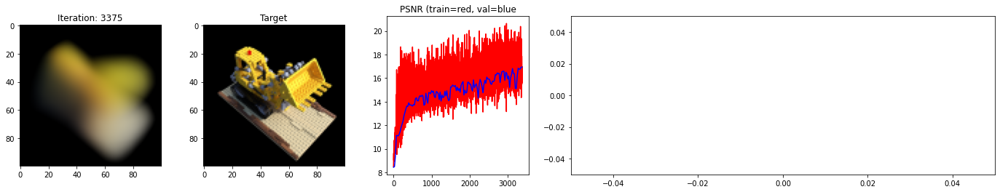

 34%|███▍      | 3400/10000 [2:27:28<4:42:02,  2.56s/it]

Loss: 0.023831911385059357


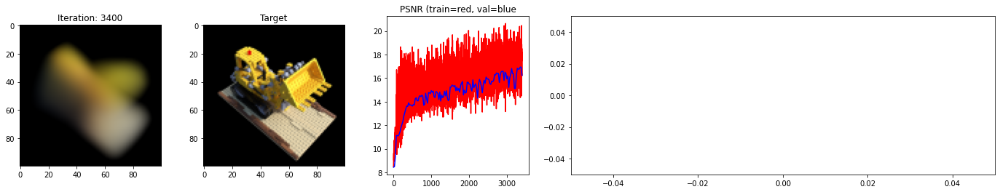

 34%|███▍      | 3425/10000 [2:28:36<4:52:02,  2.67s/it]

Loss: 0.023613765835762024


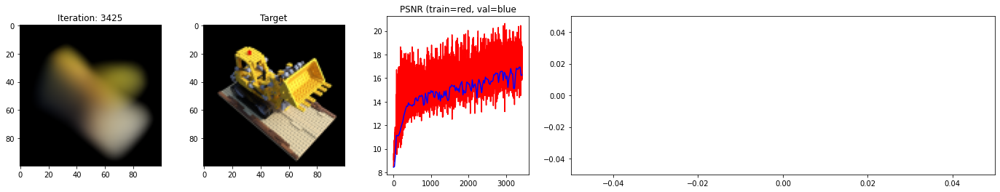

 34%|███▍      | 3450/10000 [2:29:43<4:35:39,  2.53s/it]

Loss: 0.02418046072125435


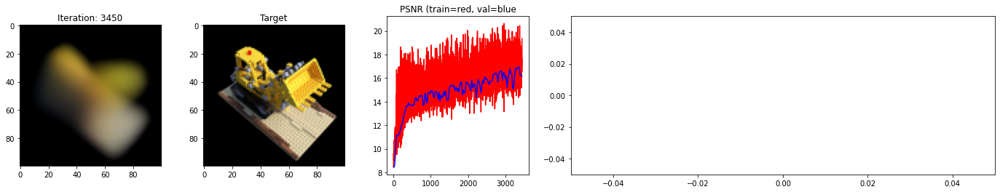

 35%|███▍      | 3462/10000 [2:30:16<4:58:27,  2.74s/it]

In [ ]:
for _ in range(n_restarts):
  model, optimizer, warmup_stopper = init_models()
  success, train_psnrs, val_psnrs = train()
  if success and val_psnrs[-1] >= warmup_min_fitness:
    print('Training successful!')
    break

print('')
print(f'Done!')